Ok so this here sheet is going to be the full image subtraction routine for SN photometry. Note that it is being written to be applied to a single filter at a time, for simplicity! This version is a massive refactor of the old version, starting at 1.73, designed to work with a smaller footprint and PSF photometry (rather then differential).

Note that following the original script from GROWTH 2020, this script will remove the processed directories when you run it, so careful!

This version does not require any alginment beforehand, but should be plate-solved (not entirely sure AIJ routine is good enough, there is another sheet in this directory to handle that). **Without the plate solve, this script will throw you strange errors!**

**The source directory should contain just the source images**, and the configuration directory has a bunch of configuration files that this script needs. The data directory will be created by this code as the sources images + conifguration files, and the processed directory will be....the processed directory! The out directory contains some random files that are produced in the process, as well as the final difference images.

Note you will have to move the processed files out of the processed/out/ directory into long-term storage of some kind. Same with the resulting PSF photometry file.

Revision History:
1.0: Initiall started with 1.73 from the old version. Frustratingly...the light curve is almost exactly the same :-( I guess we have to mess with the saturated stars? That utterly failed, you have to remove all the stars in the all the images. BUT --- changing the normalization to ALL REFERENCE kinda DID work!!

# Dependencies

The original code used a number of dependencies - we might not be using them all. I'm leaving these here for reference. I've managed to get them up and running on Pop_OS, but not Slackware, so these instructions are not a guarantee!

(there are other things that need to be install via pip, like photutils,image_registration,astroalign....)

SWarp https://www.astromatic.net/software, in apt but that version doesn't seem to do anything...trying from source. That lead me down the autogen rabbithole. Install autoconf,libtool via apt, then ./autogen.sh. Now configure and make.

SExtractor https://www.astromatic.net/software (this appears to be in apt...yeah it's a name change, it's source-extractor now!)

PSFex https://www.astromatic.net/software (in apt!)

ds9 http://ds9.si.edu/site/Home.html (seems to just be a binary, so putting it in /usr/local/bin!) (this is not actually used in this sheet, just including it for full information...it pops out the graphics in a new window and allows for interactions, so might be helpful later)

# "Instructions"

Just to be very clear, things that need to be done to make this sheet workable. Do this stuff FIRST - if you, for example, copy the files in after one of the cells that tried to copy them into the right place, you will fail!

1. Plate solve stacked images - AIJ first.
2. Copy images for a single filter into the "source" directory.
3. Change the source position in the cell below.
4. Change everything back to default before running for the first time!

In [1]:
# some parameters first.

# name the output file!
# this contains PSF photometry, for plotting in gnuplot 
output_file="ctn-B-1.73-PSF.dat"

# Images will be resampled to this size (might have x,y switched!)
# Ok, these seem not to impact the resampled files, which are the only thing we use.

# images generally need to be cropped down below their smallest dimension. Look for black edges and bad
# PSFs to be signs that this needs to be smaller.
SWARPSIZEX=200 #Default 1800
SWARPSIZEY=200 #Deault 900

# bg changes sometimes needed for smaller images
bg_size=20 # for smoothing the background estimator (default 30-50)
filter_size=3 # size for median filter of background estimator (default 3)
rad=10 #pixels for source subtract in the background, default 10

# source position (needed for the windowed subtraction scheme)
RA=128.249
Dec=-27.449311
window=20 # size of windowed region (20-50 default) Be very careful, we need like 10-15 pixels of RADIUS for the photometry!

# size of the psf stamp - total side length, not half!
# this does control clustering, in that we check that multiple peaks are not found in this same window
# So needs to be "small"
size_of_psf=19 #default 59 - must be odd!

# parameters for creation of ePSF
high_thresh=25
low_thresh=10
oversample=1 # get higher resolution in the PSF - not sure this matters, 1 is default.
iterations= 10 # iternations for the PSF builder - 10 is default.
# need next line for ePSF, or just photometry?
init_rad=5 # pixels of initial radius for fit...I hope it's just the initial! 10 default

# The PSF photometry routine is interactive, and at the end of the notebook. 
# Those parameters can be found there.

##################################################################################
# these are pretty much all the parameters I added to the routine.
# Mask sources in background estimation
bg_mask_flag=1 # 1 for masked, 0 for unmasked!
# try increasing this to 4 if sources are not found in the background.
bkg_sigma_clip=3 # Sigma Clipping level - data removed outside of +/- this parameter. Default 3, can be None if you want no clipping.
bkg_sigma_thresh=2 # threshold above the background which to consider sources as sources.

# Now a flag for masking out saturated sources *completely* in the image. This was originally done to fix
# pnt, but it seems to be a fix for the bad PSF problem in previous images. It should maybe be the default!
# Note there is also a saturation level which can be set in the that block, lower down.
# dpj: this helped separate the source from the galaxy.
# This really has to be turned on carefully, if the image is very saturated it makes things worse!
# This is NOT updated for the PSF version!
# NOT Currently working, don't use it!
sat_mask_flag=0 # default 0

stamp_rad=20 # radius of the stamp used to remove pixels around saturated ones.
pixmask=1 # connected pixels needed to mask, so MORE means LESS masking
SAT_FRAC=0.50 # Above this saturation fraction, mask the sources

# We wrote a routine to filter the catalogs before normalization to remove flagged sources (generally saturated or
# other bad things) but that did not seem to improve the situation here (sse), so we are giving up! Change this flag
#if you like, but no evidence that it actually helps!
filter_cat_flag=0 # default 0
# in the outlier elimination, also - reduced the spread over the normalization, but didn't actually improve
# the resulting images! arg! This gives a 3 sigma filter on the flux ratios.
eliminate_outliers_flag=1 # default 0

show_images_flag=1 # default 0, just shows more information during the subtraction step.
extract_thresh=5 # Threshhold for detection above sigma - default 5

# This flag is going to implement the background subtraction routine BEFORE the resampling step.
# This is not the original behavior of the GROWTH workshop, but we are trying to deal with pnt,
# and the subtraction seems to be very inconsistent
bg_subtract_pre_resamp_flag=0 # default 0 Didn't help the first time I tried it!




First import relevant packages:

In [2]:
# comment them all out for now
import os  #Call commands from outside Python
import numpy as np

# Running external programs
import subprocess
import shutil

from astropy.coordinates import SkyCoord # For the catalog analysis during normalization
import astropy.units as u # for coordinate units

from astropy.io import fits #FITS files handling
#from astropy.io import ascii  #Read/write ascii files
from astropy.wcs import WCS # for the cropping routine/coord conversions


# Background subtraction
#import photutils
#from photutils.detection import DAOStarFinder
from photutils.segmentation import detect_threshold, detect_sources
from photutils.background import Background2D, MedianBackground 
from astropy.stats import sigma_clipped_stats, SigmaClip # statistics
from photutils.utils import circular_footprint

# PSF Tools
from photutils.detection import find_peaks
from astropy.table import Table
from astropy.nddata import NDData
from photutils.psf import extract_stars, EPSFBuilder, PSFPhotometry
from astropy.table import vstack, QTable
from photutils.detection import DAOStarFinder


# Image registration and shifting
from image_registration import chi2_shift
from image_registration.fft_tools import shift
import scipy
#from scipy import ndimage, misc
#from astropy.table import Table # for catalog manipulation

# Useful to smooth the images with a Gaussian kernel before the subtraction
#from scipy.signal import convolve as scipy_convolve
#from astropy.convolution import convolve, convolve_fft # for saturation star masks during convolution.

# For rotation
#import astroalign as aa

# Plot
import matplotlib.pyplot as plt
from astropy.visualization import simple_norm

# Math help
import math

# Aperture photometry at the end
from photutils.aperture import CircularAperture, ApertureStats, CircularAnnulus
#from photutils.aperture import aperture_photometry
#from astropy.nddata import Cutout2D
#from photutils.segmentation import SourceFinder # segment photometry
#from photutils.segmentation import deblend_sources # deblending sources
#from photutils.segmentation import SegmentationImage # incase there are no sources to deblend...

#from photutils.segmentation import SourceCatalog # Source catalog shit
#from photutils.utils import calc_total_error # error calculation shit ahhhh!

import csv # for writing to output file

In [3]:
# Set directory structure
cwd = os.getcwd()

print("You start from the directory:", cwd)

source_dir = os.path.join(cwd, 'source') # All the stacked, rotated files should be in here
data_dir = os.path.join(cwd, 'data') # empty, but will get rewritten.
if os.path.isdir(data_dir): # checks and removes if it exists. 
    shutil.rmtree(data_dir)
os.mkdir(data_dir)
proc_dir = os.path.join(cwd, 'processed') # all processes fits files.
out_dir = os.path.join(proc_dir, 'out') # output files are here
if os.path.isdir(proc_dir): # checks and removes if it exists. 
    shutil.rmtree(proc_dir)
os.mkdir(proc_dir)
os.mkdir(out_dir)
config_dir = os.path.join(cwd, 'config') # various configuration files, should exist!
if os.path.exists(config_dir)==False:
    print("Error, config directory does not exist!")
    raise

for f in os.listdir(source_dir): # copy sources into data directory.
    shutil.copy2(os.path.join(source_dir, f), os.path.join(data_dir,f))
for f in os.listdir(config_dir): # copy configuration into data directory.
    shutil.copy2(os.path.join(config_dir, f), data_dir)
for f in os.listdir(data_dir): # copy data into processed and change to it.
    shutil.copy2(os.path.join(data_dir, f), proc_dir)

os.chdir(proc_dir)
print("You are working in the image_subtraction/processed/ directory: ")
print("Full path:", proc_dir)

You start from the directory: /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction
You are working in the image_subtraction/processed/ directory: 
Full path: /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed


In [4]:
#List the images we are going to process
rot_name_array=[]
for f in os.listdir(source_dir): # create list of raw images
    rot_name_array.append(f)
    
rot_name_array.sort() # sorted by name so that discovery is first.
rot_name_array

['SUM_Aligned_20230308_B.fits',
 'SUM_Aligned_20230309_B.fits',
 'SUM_Aligned_20230310_B.fits',
 'SUM_Aligned_20230311_B.fits',
 'SUM_Aligned_20230312_B.fits',
 'SUM_Aligned_20230313_B.fits',
 'SUM_Aligned_20240119_B.fits']

## Subtraction Routine

This part comes from the GROWTH 2020 school, with my own modifications and dealing with some recent changes to the code. We'll start with a dependency check:

(for now skipping all reference to ds9, since that doesn't actually seem that useful atm.)

In [5]:
def test_dependency(dep, alternate_name=None):
    """
    Test external dependency by trying to run it as a subprocess
    """
    try:
        subprocess.check_output(dep, stderr=subprocess.PIPE, shell=True)
        print("%s is installed properly as %s. OK" % (dep, dep))
        return 1
    except subprocess.CalledProcessError:
        try:
            subprocess.check_output(alternate_name, stderr=subprocess.PIPE, shell=True)
            print("%s is installed properly as %s. OK" % (dep, alternate_name))
            return 1
        except subprocess.CalledProcessError:
            print("===%s/%s IS NOT YET INSTALLED PROPERLY===" % (dep, alternate_name))
            return 0

#dependencies = [('sextractor', 'sex'), ('SWarp', 'swarp'), ('psfex', 'PSFEx'), ('ds9', 'DS9')]
#dependencies = [('sextractor', 'source-extractor'), ('SWarp', 'swarp'), ('psfex', 'PSFEx'), ('ds9', 'DS9')]
dependencies = [('sextractor', 'source-extractor'), ('SWarp', 'swarp'), ('psfex', 'PSFEx')]
i = 0
for dep_name1, dep_name2 in dependencies:
    i += test_dependency(dep_name1, dep_name2)
print("%i out of %i external dependencies installed properly.\n" % (i, len(dependencies)))
if i != len(dependencies):
    print("Please correctly install these programs before continuing by following the instructions in README.md.")
else:
    print("You are ready to continue.")   

sextractor is installed properly as source-extractor. OK
SWarp is installed properly as swarp. OK
psfex is installed properly as psfex. OK
3 out of 3 external dependencies installed properly.

You are ready to continue.


## Align the images

Use the AstrOmatic Swarp package to align the images.  Swarp relies on the astrometric information of the image (in other words, on the sky coordinates), therefore both the science and reference images must be astrometrically calibrated (for example, using the AstrOmatic SCAMP package or AIJ).  In this module we assume that the input images are already calibrated.

We are going to pass the entire list to swarp at once, methinks. Create the swarp filelist dynamically, to reduce the kinds of errors we will make in the future!

There is a wrapper for this here: https://github.com/mriener/swarp_wrapper that might be worth exploring in the future, in case there is some system for which we cannot get Swarp installed. I think you could also do this with repoject: https://reproject.readthedocs.io/en/stable/mosaicking.html

In [6]:
swarp_filelist_name=config_dir+"/"+'swarp_filelist.txt'
swarp_filelist = open(swarp_filelist_name, 'w')
for f in rot_name_array: 
    #rot_image_array.append(f)
    print(f)
    swarp_filelist.write(str(f) + "\n")
swarp_filelist.close()


SUM_Aligned_20230308_B.fits
SUM_Aligned_20230309_B.fits
SUM_Aligned_20230310_B.fits
SUM_Aligned_20230311_B.fits
SUM_Aligned_20230312_B.fits
SUM_Aligned_20230313_B.fits
SUM_Aligned_20240119_B.fits


This next command implements the cropping specified in the parameters section.

In [7]:
# Swarp command
# had to change capitalization of SWarp!
try:
    #command = "swarp %s %s -c %s -SUBTRACT_BACK N -RESAMPLE Y -RESAMPLE_DIR . -COMBINE N -IMAGE_SIZE 1800,900" % (sci_image_name, ref_image_name, os.path.join(config_dir, 'config.swarp'))
    if bg_subtract_pre_resamp_flag==0:
        command = "swarp @%s -c %s -SUBTRACT_BACK N -RESAMPLE Y -RESAMPLE_DIR . -COMBINE N -IMAGE_SIZE %s,%s" % (swarp_filelist_name, os.path.join(config_dir, 'config.swarp'),SWARPSIZEX,SWARPSIZEY)
    elif bg_subtract_pre_resamp_flag==1:
        print("Subtracting Background Before resampling...\n")
        command = "swarp @%s -c %s -SUBTRACT_BACK Y -RESAMPLE Y -RESAMPLE_DIR . -COMBINE N -IMAGE_SIZE %s,%s" % (swarp_filelist_name, os.path.join(config_dir, 'config.swarp'),SWARPSIZEX,SWARPSIZEY)
    print('Executing command: %s' % command)
    rval = subprocess.run(command.split(), check=True)
    print('Success!')
except subprocess.CalledProcessError as err:
    print('Could not run SWarp with exit error %s'%err)

# Gotta fix the names of the aligned images
swarp_filelist = open(swarp_filelist_name, 'r')
align_image_array=[]
for line in swarp_filelist:
    #print(line)
    align_image_array.append(line.strip().replace(".fits", ".resamp.fits").replace('data','processed'))
swarp_filelist.close()

Executing command: swarp @/media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/config/swarp_filelist.txt -c /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/config/config.swarp -SUBTRACT_BACK N -RESAMPLE Y -RESAMPLE_DIR . -COMBINE N -IMAGE_SIZE 200,200


> 
----- SWarp 2.41.5 started on 2025-02-17 at 21:06:36 with 12 threads

> Examining input data ...
> Looking for SUM_Aligned_20230308_B.fits ...
> Looking for SUM_Aligned_20230309_B.fits ...
> Looking for SUM_Aligned_20230310_B.fits ...
> Looking for SUM_Aligned_20230311_B.fits ...
> Looking for SUM_Aligned_20230312_B.fits ...
> Looking for SUM_Aligned_20230313_B.fits ...
> Looking for SUM_Aligned_20240119_B.fits ...
> Creating NEW output image ...
> Creating NEW weight-map ...
> 
------- Output File swarpout.fits:
    "no ident"  WEIGHTED  no ext. header  200x200  32 bits (floats)
    Center: 08:32:59.90 -27:26:58.1   2.39'x2.39'  Scale: 0.7174 ''/pixel
    Gain: 0 e-/ADU   Flux scaling (astrom/photom): 1 X / 1 X

> Loading input data ...
> 
-------------- File SUM_Aligned_20230308_B.fits:
    "SN2023ctn"  unweighted  no ext. header  2250x1800  32 bits (floats)
    Center: 08:33:00.20 -27:26:58.9   26.9'x21.5'  Scale: 0.717 ''/pixel
    Gain: 4 e-/ADU   Flux scaling (astrom/photom): 

Success!


> Setting up background map at line:   1024 / 1800   
> Setting up background map at line:   1536 / 1800   
> Filtering background map(s) ...
> Computing backgound d-map ...
> Computing backgound-noise d-map ...
    Background: 838.4265   RMS: 60.61974

> Reading SUM_Aligned_20240119_B.fits
> Resampling SUM_Aligned_20240119_B.fits ...
> Resampling line:      0 / 200    
> Closing files ...
> 
> All done (in 0.6 s)


In [8]:
align_image_array


['SUM_Aligned_20230308_B.resamp.fits',
 'SUM_Aligned_20230309_B.resamp.fits',
 'SUM_Aligned_20230310_B.resamp.fits',
 'SUM_Aligned_20230311_B.resamp.fits',
 'SUM_Aligned_20230312_B.resamp.fits',
 'SUM_Aligned_20230313_B.resamp.fits',
 'SUM_Aligned_20240119_B.resamp.fits']

Can use AstroImageJ to verify this basically looks right. - putting in a image check step here, since the next step sometimes gets borked.

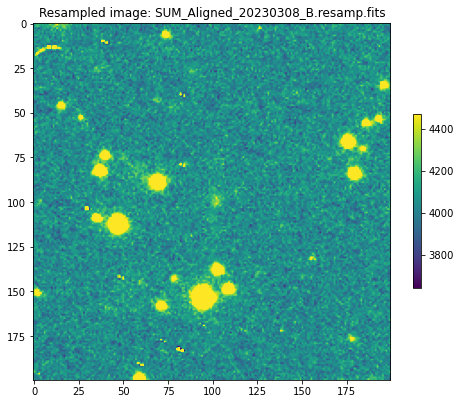

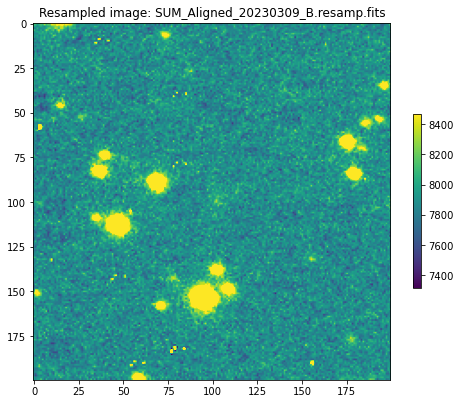

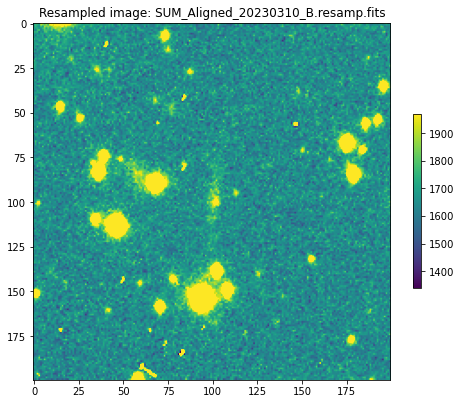

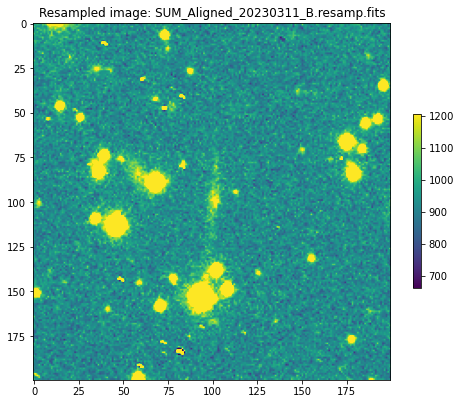

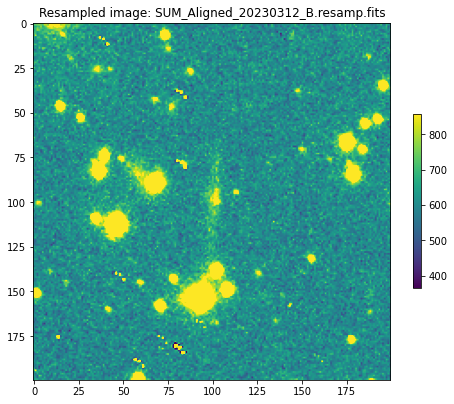

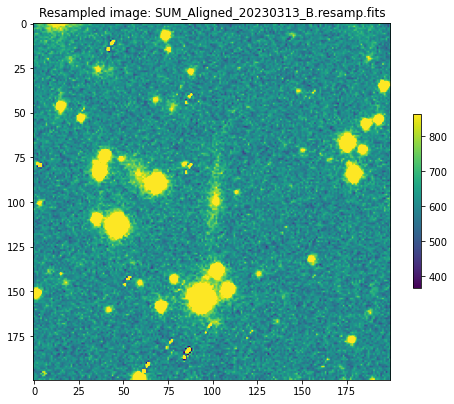

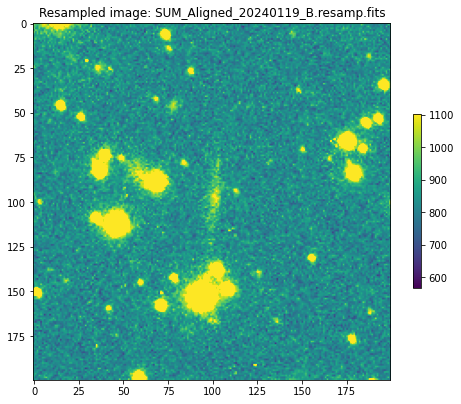

In [9]:
for i in range(len(align_image_array)):
    image = fits.open(align_image_array[i])
    mean, median, std = sigma_clipped_stats(image[0].data)
    plt.figure(figsize=(8,8))

    # set the scale of the image based on its statistics
    # Name looks totally wrong!
    plt.imshow(image[0].data, vmin=median-5*std, vmax=median+5*std)
    plt.colorbar(shrink = 0.4)
    plt.title('Resampled image: '+align_image_array[i])
    plt.show()



# Background Subtraction
- Mask sources in images
- Use 3 sigma clipping to filter data and accurately measure the backgorund
- Then split image into boxes and apply 2x2 median filter

That was the original. We are going to (for the first image)

1) look at the scalar background (for no good reason!)
2) look at the 2D background with no mask
3) look at the 2D background a mask

And then assume (3) is best and go ahead with subtracting them all! (Although there is a flag for setting that by hand.

Note that the final background subtraction is skipped if the flag indicating that it should already have
happened during the resampling step is set to 1!

In [10]:
# Let's loop through the images and check the essential statistics on each background.

sigma_clip = SigmaClip(sigma=3.0, maxiters=20) # parameters for estimation
footprint = circular_footprint(radius=rad) #size of source subtraction?
print("Mean, Median, and Standard Deviation for the background in each image\n\n")
for i in range(len(align_image_array)):
    image = fits.open(align_image_array[i])
    hdr = image[0].header #save fits header
    threshold = detect_threshold(image[0].data, nsigma=2.0, sigma_clip=sigma_clip)
    segment_img = detect_sources(image[0].data, threshold, npixels=10)
    
    mask = segment_img.make_source_mask(footprint=footprint)
    mean, median, std = sigma_clipped_stats(image[0].data, sigma=3.0, mask=mask)
    print((mean, median, std))  

Mean, Median, and Standard Deviation for the background in each image


(4049.1316, 4048.953, 78.59189)
(7881.4175, 7881.0166, 108.878586)
(1646.7618, 1646.3506, 58.53428)
(926.13275, 926.1498, 49.60447)
(604.0528, 603.8183, 44.699863)
(607.80444, 607.6736, 45.253456)
(826.8077, 826.3733, 47.763348)


I guess just look for outliers....

2D background estimator (N x N box, 3x3 median filter, set at beginning). Look and decide on using masked vs unmasked based on the first image - we'll see all the results later.

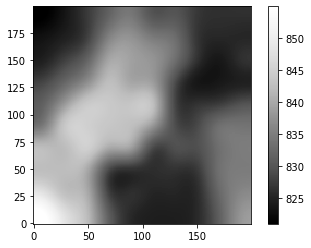

In [11]:
bkg_estimator = MedianBackground()
sigma_clip = SigmaClip(sigma=3.0)
bkg = Background2D(image[0].data, (bg_size,bg_size), filter_size=(filter_size, filter_size),sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)
plt.imshow(bkg.background, origin='lower', cmap='Greys_r',interpolation='nearest')
plt.colorbar()

But this is unmasked, and it does look like the stars are impacting the background. So let's try the same with a mask.

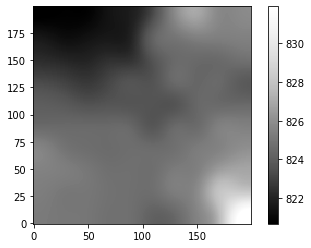

In [12]:
bkg = Background2D(image[0].data, (bg_size,bg_size), filter_size=(filter_size, filter_size),sigma_clip=sigma_clip, bkg_estimator=bkg_estimator,mask=mask)
plt.imshow(bkg.background, origin='lower', cmap='Greys_r',interpolation='nearest')
plt.colorbar()

So actually, sometimes the unmasked background here looks *better*, at least with this first image. So I'm going to set a flag to decide which background to use. This should probably be set to default to the masked, however!

Subtracting background with a mask...
Mean, Median, and Standard Deviation for the background
(2.7317503309507507, 2.5705015608969006, 78.52580162376569)
Writing background subtracted file SUM_Aligned_20230308_B_bkgsub.fits 
Subtracting background with a mask...
Mean, Median, and Standard Deviation for the background
(2.0784306981264686, 1.5485533117102932, 108.5615011853246)
Writing background subtracted file SUM_Aligned_20230309_B_bkgsub.fits 
Subtracting background with a mask...
Mean, Median, and Standard Deviation for the background
(2.0050704272076643, 1.5841721778251667, 58.36032991312148)
Writing background subtracted file SUM_Aligned_20230310_B_bkgsub.fits 
Subtracting background with a mask...
Mean, Median, and Standard Deviation for the background
(1.114314167817526, 1.1859432397783962, 49.45310022138096)
Writing background subtracted file SUM_Aligned_20230311_B_bkgsub.fits 
Subtracting background with a mask...
Mean, Median, and Standard Deviation for the background
(1.6250

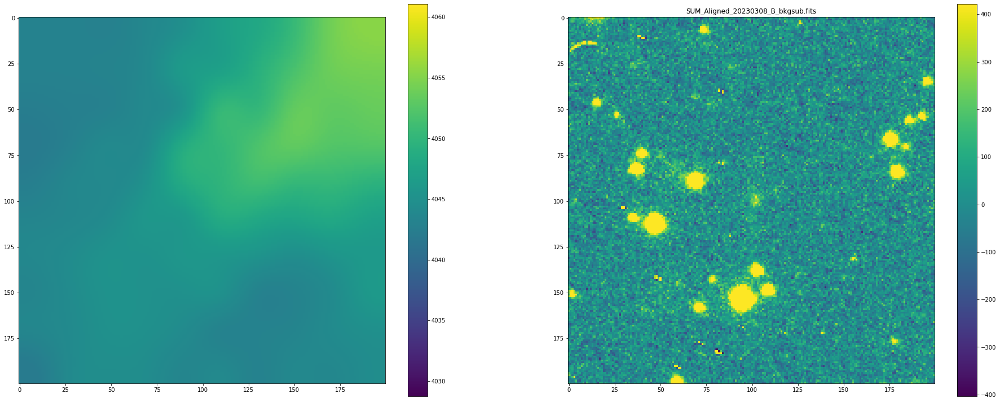

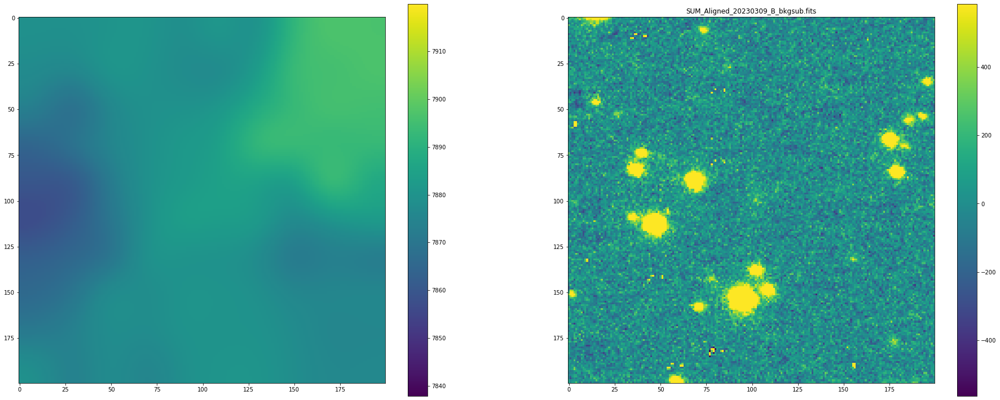

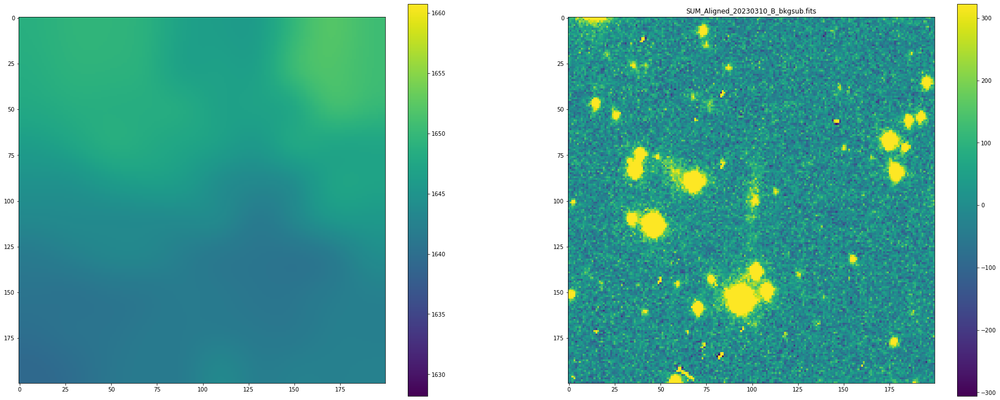

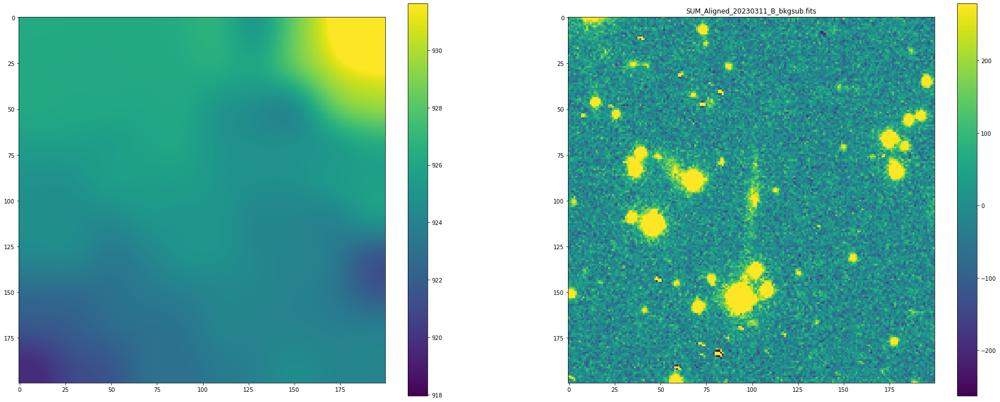

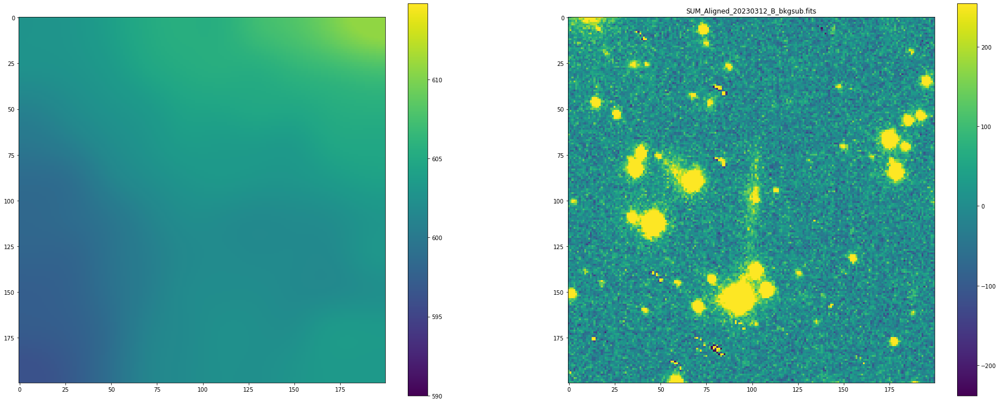

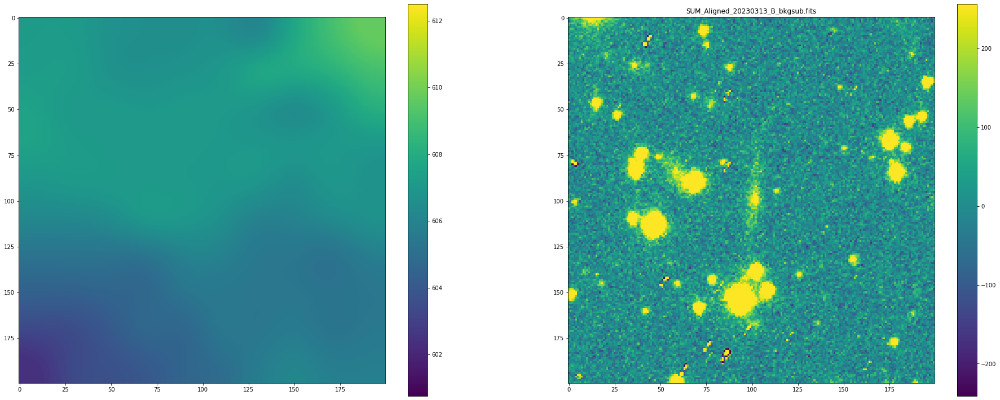

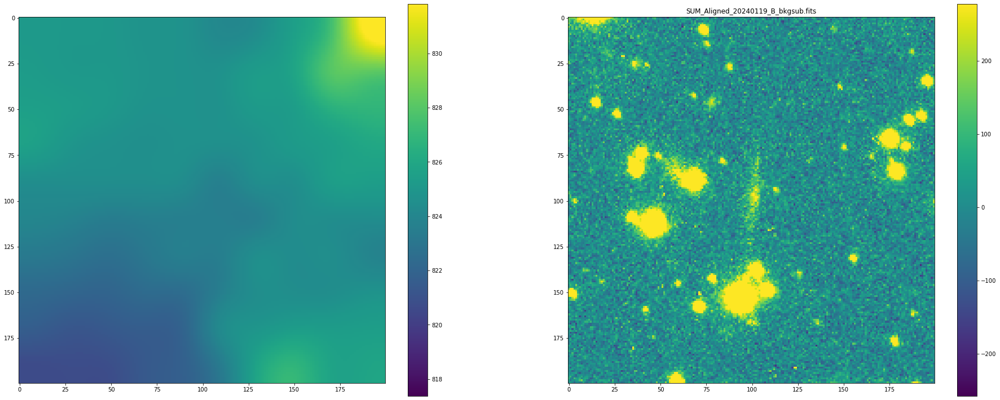

In [13]:
# Do this for each image in the array.
bkg_subtract_array=[]
for i in range(len(align_image_array)):
    image = fits.open(align_image_array[i])
    hdr = image[0].header #save fits header
    
    # Basic background set up.
    bkg_estimator = MedianBackground()
    sigma_clip = SigmaClip(sigma=bkg_sigma_clip)
    threshold = detect_threshold(image[0].data, nsigma=bkg_sigma_thresh, sigma_clip=sigma_clip)
    
    # get source mask individually for each image (didn't have to do this on ctn!)
    if bg_mask_flag==1:
        # get source mask individually for each image (didn't have to do this on ctn!)
        print("Subtracting background with a mask...")
        segment_img = detect_sources(image[0].data, threshold, npixels=10)
        mask = segment_img.make_source_mask(footprint=footprint) # mask too big once?
        # sometimes need to evaluate the mask...
        #print(mask.sum())
        # measure and subtract the background
        # note this exclude_percentile is default 10, and more means more exclusions. From the Docs, "For best results, 
        # exclude_percentile should be kept as low as possible ", although increasing has fixed a few errors.
        bkg = Background2D(image[0].data, (bg_size,bg_size), filter_size=(filter_size,filter_size),\
                       sigma_clip=sigma_clip, bkg_estimator=bkg_estimator,mask=mask,exclude_percentile=10.0)
    if bg_mask_flag==0:
        # use unmasked background.
        print("Subtracting background without a mask...")
        bkg = Background2D(image[0].data, (bg_size,bg_size), filter_size=(filter_size, filter_size),sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)

    # write background file
    bkg_subtract_name=align_image_array[i].replace(".resamp.fits", "_bkgsub.fits")
    bkg_subtract_array.append(bkg_subtract_name)
    if bg_subtract_pre_resamp_flag==0: # do this background subtraction...
        image[0].data = image[0].data - bkg.background
    elif bg_subtract_pre_resamp_flag==1: # don't do it, it's already been done!
        print("Background subtraction already happened during resampling step!\n")
    hdu_image_sub = fits.PrimaryHDU(image[0].data,image[0].header) #added headers! Includes SAT level!
    hdu_image_sub.writeto(bkg_subtract_name,overwrite=True)
    
    print("Mean, Median, and Standard Deviation for the background")
    mean, median, std = sigma_clipped_stats(image[0].data, sigma=3.0, mask=mask)
    print((mean, median, std))  
    print("Writing background subtracted file",bkg_subtract_name,"\n===============================================")
    #plotting for evaluation
    fig, axs = plt.subplots(1, 2,figsize=(32,32)) # could add figsize command...
    plt.title(bkg_subtract_name)
    mean, median, std = sigma_clipped_stats(bkg.background)
    pcm=axs[0].imshow(bkg.background, vmin=median-5*std, vmax=median+5*std)
    plt.colorbar(pcm,ax=axs[0],shrink=0.4)
    mean, median, std = sigma_clipped_stats(image[0].data)
    pcm=axs[1].imshow(image[0].data, vmin=median-5*std, vmax=median+5*std)
    plt.colorbar(pcm,ax=axs[1],shrink=0.4)

These images look right in AIJ, but I did get an error that these images are now double precision, whereas AIJ expects single precision. Fine for now?

In [14]:
bkg_subtract_array

['SUM_Aligned_20230308_B_bkgsub.fits',
 'SUM_Aligned_20230309_B_bkgsub.fits',
 'SUM_Aligned_20230310_B_bkgsub.fits',
 'SUM_Aligned_20230311_B_bkgsub.fits',
 'SUM_Aligned_20230312_B_bkgsub.fits',
 'SUM_Aligned_20230313_B_bkgsub.fits',
 'SUM_Aligned_20240119_B_bkgsub.fits']

## PSF matching

The atmosphere heavily affects the PSF of the images by determining the "seeing" conditions. The seeing for ground-based optical telescopes is usually measured as the FWHM of the imaging PSF.  Properties of the atmosphere can change very rapidly, so it is rare that science and reference images are characterized by the same seeing. Therefore their PSFs are usually different, which is a problem for image subtraction. 


### Generate the kernel for the convolution

The PSF of the science and reference images can be matched in several different ways.  Here we start by performing a first source extraction on the reference image (which we assume to be the last in the list).  We can use the catalogs of sources that we obtain for two main purposes: <br />
1. Measure the PSF of the science reference frame, using PSFex or photutils. The original used PSFex, this one is going to create an ePSF using photutils. We'll also create a matching kernel from Astropy Modules.
2. Obtain instruments magnitudes that will be the basis for the zero-point calibration (see Photometry module).  


In [15]:
# Function to create a circular stamp.
def mask_function(mask,x,y,radius):
    for i in range(-(radius-1),radius):
        for j in range(abs(i)-(radius-1),radius-abs(i)):
            #print(x+i,y+j)
            mask[x+i][y+j]=True
    return(mask)

In [16]:
# Block for masking out the saturated stars.
# This is NOT functional at this moment!

if sat_mask_flag==1:
    for i in range(len(bkg_subtract_array)):
        # grab the saturation level ...
        file_name=os.path.join(proc_dir, bkg_subtract_array[i])
        # get saturation level
        image = fits.open(file_name) # only need open to read the header
        SAT=image[0].header['SATURATE']
        print("Saturation level",SAT)
        # Check histogram?
        #mean, median, std = sigma_clipped_stats(image[0].data)
        #plt.imshow(image[0].data,vmin=median-2*std,vmax=median+2*std)
        #plt.show()
        #hist_data=(image[0].data).flatten()
        #print(hist_data.shape,(image[0].data).shape)
        #plt.hist(hist_data, bins=1000,range=(0,40000))
        #plt.show()

        
        # No, this block needs to mask out a CIRCLE around the saturated source, otherwise we get those missing
        # black spots in the PSF...
        # try to use the existing code as much as possible...
        
        # let's just mask out a stamp around every saturated pixel?
        mask_bool=np.full((image[0].data.shape[0], image[0].data.shape[1]), False, dtype=bool)
        for j in range(image[0].data.shape[0]):
            for k in range(image[0].data.shape[1]):
                if image[0].data[j][k] > SAT:
                    print("Saturation ",image[0].data[j][k],"at ",k,j,"")
                    mask_function(mask_bool,j,k,stamp_rad)
        
        # set the threshhold to like 80% of that level....
        #limit=SAT_FRAC*SAT
        # use segment images to mask the sources which have any pixels over that 80% level...
        # 1 connected pixels greater than the limit. Not that a larger value here means LESS masking.
        # npixels=4 worked before, but found nothing in B filter...
        #segment_map = detect_sources(image[0].data, limit, npixels=pixmask)
        #print(segment_map)
        #plt.imshow(segment_map, cmap=segment_map.cmap,interpolation='nearest')
        #plt.show()
        # ...
        # profit?
        '''
        if (segment_map == None): # if there are no saturated sources, skip this!
            masked_image=image[0].data
            print("No saturated sources found")
        else:
            mask_bool=segment_map.make_source_mask()
            # Walk over the segment map and create a mask with stars masked around each saturated star.
            for j in range(image[0].shape[0]):
                for k in range(image[0].shape[1]):
                    if segment_map.data[j][k]==1:
                        #print("Found a source!",j,k)
                        mask_function(mask_bool,j,k,stamp_rad) # this thing will mask out a stamp of the right radius
                        
            #mask_bool=segment_map.make_source_mask()
            '''
        # used to have np.NaN in here, but let's try zero.
        masked_image=np.where(mask_bool==False,image[0].data,0)
        #mean, median, std = sigma_clipped_stats(masked_image)
        #plt.imshow(masked_image,vmin=median-2*std,vmax=median+2*std)

        fig, axs = plt.subplots(1, 2,figsize=(16,16)) # could add figsize command...
        plt.title(file_name)
        mean, median, std = sigma_clipped_stats(mask_bool)
        pcm=axs[0].imshow(mask_bool, vmin=median-5*std, vmax=median+5*std)
        plt.colorbar(pcm,ax=axs[0],shrink=0.4)
        mean, median, std = sigma_clipped_stats(masked_image)
        pcm=axs[1].imshow(masked_image, vmin=median-5*std, vmax=median+5*std)
        plt.colorbar(pcm,ax=axs[1],shrink=0.4)

        # now write the masked image to the original image location, so the names don't have to get messed around with.
        hdu_image_sub = fits.PrimaryHDU(masked_image,image[0].header) #added headers! Includes SAT level!
        hdu_image_sub.writeto(file_name,overwrite=True) # overwrite the files so we can continue without change.

else:
    print("Vanilla routine, saturated stars NOT masked")

Vanilla routine, saturated stars NOT masked


In [17]:
# clean the catalog for saturated sources
# table has to be right from find_peaks
# image is just the data, not the headers and things
def clean_cat(image,sat_level,table,radius):
    # find all the saturated pixels
    sat_pix=[]
    for j in range(image.shape[0]):
        for k in range(image.shape[1]):
            if image[j][k] > sat_level:
                sat_pix.append([j,k])
    # check that each source location found is not within one radius of a saturated pixel
    for j in range(len(table)-1,0,-1):
        for k in range(len(sat_pix)):
            if ( (table[j]['x_peak'] == sat_pix[k][0] ) & (table[j]['y_peak'] == sat_pix[k][1]) ):
                print("Catalog cleaned of a Saturated Source")
                table.remove_row[j]
    return table

Reference is: /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20240119_B_bkgsub.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


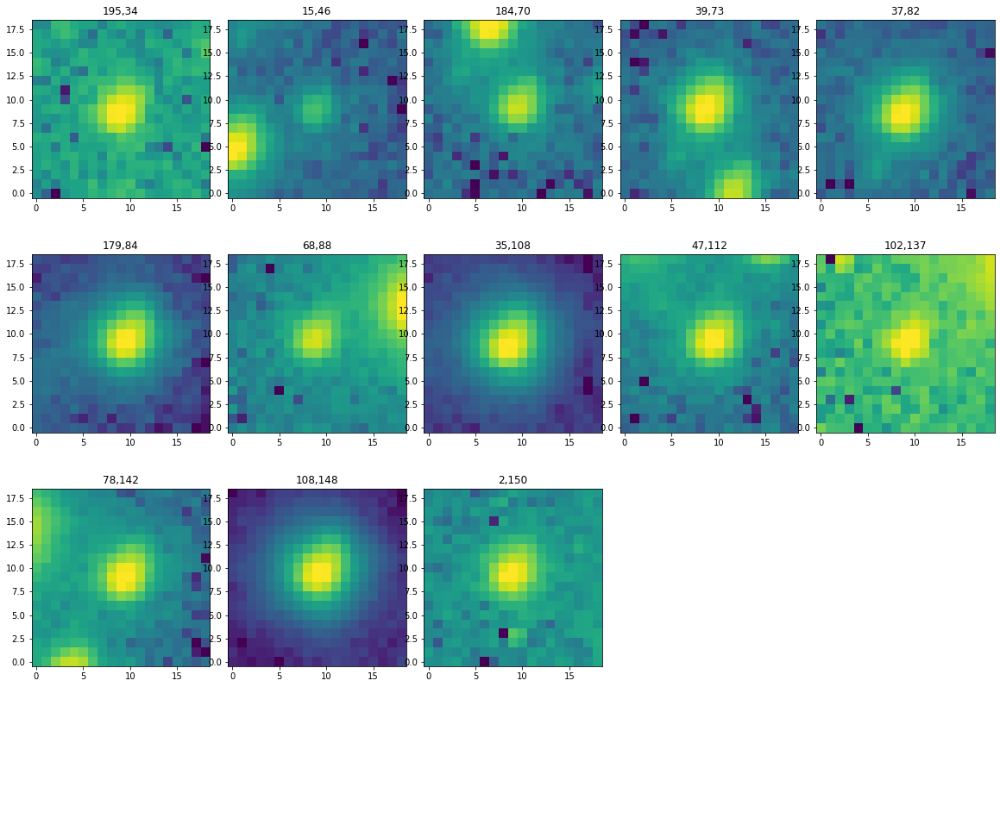

'\n#set up photometry\npsf_model = epsf\nfit_shape = (size_of_psf, size_of_psf) # what should these be?\n# what is the aperature_radius doing here?\n# sounds like it\'s just an initial value.\npsfphot = PSFPhotometry(psf_model, fit_shape,aperture_radius=init_rad)\n\n# create a table with data....this should be ADDED to each iteration.\ninit_params = QTable()\n# source x,y in the...subtracted image?\nsub_image = fits.open("out/"+sub_array[i])\nw = WCS(sub_image[0].header)\ncoord = SkyCoord(ra=RA * u.deg, dec=Dec * u.deg, frame=\'icrs\')\nx,y=w.world_to_pixel(coord)\ninit_params[\'x\'] = [x]\ninit_params[\'y\'] = [y]\nphot = psfphot(sub_image[0].data,init_params=init_params)\nphot[\'MJD-OBS\']=sci_conv[0].header[\'MJD-OBS\']\noutput_fluxes=vstack([output_fluxes,phot])\n'

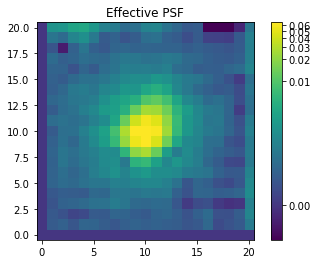

In [18]:
ref_image_bkgsub_name = os.path.join(proc_dir, bkg_subtract_array[len(bkg_subtract_array)-1])

# This is assuming the reference image is the last in the list!
bkg_subtract = fits.open(ref_image_bkgsub_name)

# detect above high threshold
threshold = detect_threshold(bkg_subtract[0].data, nsigma=high_thresh, sigma_clip=sigma_clip)
peaks_tbl = find_peaks(bkg_subtract[0].data, threshold=threshold)  
peaks_tbl = clean_cat(bkg_subtract[0].data,bkg_subtract[0].header['SATURATE'],peaks_tbl,0)
peaks_tbl['peak_value'].info.format = '%.8g'  # for consistent table output 
#print(peaks_tbl)
# also going to have a sub-threshold table, to avoid smaller peaks in the PSF region.
threshold = detect_threshold(bkg_subtract[0].data, nsigma=low_thresh, sigma_clip=sigma_clip)
sub_peaks_tbl = find_peaks(bkg_subtract[0].data, threshold=threshold)  
sub_peaks_tbl = clean_cat(bkg_subtract[0].data,bkg_subtract[0].header['SATURATE'],sub_peaks_tbl,0)
sub_peaks_tbl['peak_value'].info.format = '%.8g'  # for consistent table output 

print("Reference is:",ref_image_bkgsub_name)
print("high threshold peaks found:", len(peaks_tbl),"low threshold peaks found:",len(sub_peaks_tbl))
# Need a filter here, so that multiple sources found in the same stamp are removed from the routine
# of course, they could be within the stamp but NOT found by the routine....ugh.
# completely stolen from chatGPT...
rows_to_remove = set()
hsize=(size_of_psf-1)/2
for k in range(len(peaks_tbl)):
    for j in range(len(sub_peaks_tbl)):
        if ( (sub_peaks_tbl[j]['x_peak'] > (peaks_tbl[k]['x_peak']-hsize)) & (sub_peaks_tbl[j]['x_peak']< (peaks_tbl[k]['x_peak']+hsize))
        & (sub_peaks_tbl[j]['y_peak'] > (peaks_tbl[k]['y_peak']-hsize)) & (sub_peaks_tbl[j]['y_peak'] < (peaks_tbl[k]['y_peak']+hsize))):
            # need to make sure we aren't talking about the same source found in both!
            if ( (sub_peaks_tbl[j]['x_peak'] != peaks_tbl[k]['y_peak']) & (sub_peaks_tbl[j]['y_peak'] != peaks_tbl[k]['y_peak'])):
               #print("*",peaks_tbl[i])
               #print("*",sub_peaks_tbl[j])
                rows_to_remove.add(k)  # Remove that one
mask = np.array([i not in rows_to_remove for i in range(len(peaks_tbl))])
peaks_tbl = peaks_tbl[mask]
print("...peaks found post-filtering:",len(peaks_tbl))

x = peaks_tbl['x_peak']  
y = peaks_tbl['y_peak']  
#hsize=(size_of_psf-1)/2
mask = ((x > hsize) & (x < (bkg_subtract[0].data.shape[1] -1 - hsize)) & (y > hsize) & (y < (bkg_subtract[0].data.shape[0] -1 - hsize)))  
# table of stars
stars_tbl = Table()
stars_tbl['x'] = x[mask]  
stars_tbl['y'] = y[mask] 
#subtract sigma clipped median background
mean_val, median_val, std_val = sigma_clipped_stats(bkg_subtract[0].data, sigma=2.0)  
bkg_subtract[0].data -= median_val 
# create empty cutouts
nddata = NDData(data=bkg_subtract[0].data) 
# extract the cutouts
stars = extract_stars(nddata, stars_tbl, size=size_of_psf)
print("Removed some too close to edges, down to",len(stars))

# in principle, could put these in a table (red code below) for filtering against the saturation flag.

# print them
nrows=int(np.ceil(len(stars)/5))
fig, axs = plt.subplots(nrows, 5,figsize=(20,20),squeeze=True)
axes = axs.flatten()  # Flatten axes array for easier indexing

#nrows = math.ceil(len(stars)/5) # ok this actually misses some...
#ncols = 5
#fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20),squeeze=True)
#ax = ax.ravel()
for j in range(nrows * 5):
    ax=axes[j]
    if j < (len(stars)): # if a source, plot it
        norm = simple_norm(stars[j], 'log', percent=99.0)
        string=str(peaks_tbl[j]['x_peak'])+","+str(peaks_tbl[j]['y_peak'])
        im=ax.set_title(string)
        im=ax.imshow(stars[j], norm=norm, origin='lower', cmap='viridis')
    else:
        ax.axis('off')
plt.subplots_adjust(hspace=-0.5, wspace=0.1)
plt.show()
# fire up the ePSF builder
# max iter could be turned down for speed
# oversampling is a choice..
epsf_builder = EPSFBuilder(oversampling=oversample, maxiters=iterations,progress_bar=False)  
ref_epsf, fitted_stars = epsf_builder(stars)  

# plot it!
norm = simple_norm(ref_epsf.data, 'log', percent=99.0)
plt.title("Effective PSF")
plt.imshow(ref_epsf.data, norm=norm, origin='lower', cmap='viridis')
plt.colorbar()

# not right now?
'''
#set up photometry
psf_model = epsf
fit_shape = (size_of_psf, size_of_psf) # what should these be?
# what is the aperature_radius doing here?
# sounds like it's just an initial value.
psfphot = PSFPhotometry(psf_model, fit_shape,aperture_radius=init_rad)

# create a table with data....this should be ADDED to each iteration.
init_params = QTable()
# source x,y in the...subtracted image?
sub_image = fits.open("out/"+sub_array[i])
w = WCS(sub_image[0].header)
coord = SkyCoord(ra=RA * u.deg, dec=Dec * u.deg, frame='icrs')
x,y=w.world_to_pixel(coord)
init_params['x'] = [x]
init_params['y'] = [y]
phot = psfphot(sub_image[0].data,init_params=init_params)
phot['MJD-OBS']=sci_conv[0].header['MJD-OBS']
output_fluxes=vstack([output_fluxes,phot])
'''

Ok, so that's our effective PSF for the reference image.

### Convolve the science images with the PSF of the reference image

Now we are actually going to find the ePSFs for each of the science images, and the find a matching PSF for each pair via https://photutils.readthedocs.io/en/latest/user_guide/psf_matching.html

In [19]:
# function for building ePSF models
# data should be hdu thingy, so the keywords get transferred
def BuildePSF(data,high_thresh,low_thresh,name):
    # detect above high threshold
    threshold = detect_threshold(data[0].data, nsigma=high_thresh, sigma_clip=sigma_clip)
    peaks_tbl = find_peaks(data[0].data, threshold=threshold) 
    peaks_tbl = clean_cat(data[0].data,data[0].header['SATURATE'],peaks_tbl,0)
    peaks_tbl['peak_value'].info.format = '%.8g'  # for consistent table output 
    #print(peaks_tbl)
    # also going to have a sub-threshold table, to avoid smaller peaks in the PSF region.
    threshold = detect_threshold(data[0].data, nsigma=low_thresh, sigma_clip=sigma_clip)
    sub_peaks_tbl = find_peaks(data[0].data, threshold=threshold) 
    sub_peaks_tbl = clean_cat(data[0].data,data[0].header['SATURATE'],sub_peaks_tbl,0)
    sub_peaks_tbl['peak_value'].info.format = '%.8g'  # for consistent table output 
    
    print("Source:",name)
    print("high threshold peaks found:", len(peaks_tbl),"low threshold peaks found:",len(sub_peaks_tbl))
    # Need a filter here, so that multiple sources found in the same stamp are removed from the routine
    # of course, they could be within the stamp but NOT found by the routine....ugh.
    # completely stolen from chatGPT...
    rows_to_remove = set()
    hsize=(size_of_psf-1)/2
    for k in range(len(peaks_tbl)):
        for j in range(len(sub_peaks_tbl)):
            if ( (sub_peaks_tbl[j]['x_peak'] > (peaks_tbl[k]['x_peak']-hsize)) & (sub_peaks_tbl[j]['x_peak']< (peaks_tbl[k]['x_peak']+hsize))
            & (sub_peaks_tbl[j]['y_peak'] > (peaks_tbl[k]['y_peak']-hsize)) & (sub_peaks_tbl[j]['y_peak'] < (peaks_tbl[k]['y_peak']+hsize))):
                # need to make sure we aren't talking about the same source found in both!
                if ( (sub_peaks_tbl[j]['x_peak'] != peaks_tbl[k]['y_peak']) & (sub_peaks_tbl[j]['y_peak'] != peaks_tbl[k]['y_peak'])):
                    #print("*",peaks_tbl[i])
                    #print("*",sub_peaks_tbl[j])
                    rows_to_remove.add(k)  # Remove that one
    mask = np.array([i not in rows_to_remove for i in range(len(peaks_tbl))])
    peaks_tbl = peaks_tbl[mask]
    print("...peaks found post-filtering:",len(peaks_tbl))

    x = peaks_tbl['x_peak']  
    y = peaks_tbl['y_peak']  
    #hsize=(size_of_psf-1)/2
    mask = ((x > hsize) & (x < (data[0].data.shape[1] -1 - hsize)) & (y > hsize) & (y < data[0].data.shape[0] -1 - hsize))  
    # table of stars
    stars_tbl = Table()
    stars_tbl['x'] = x[mask]  
    stars_tbl['y'] = y[mask] 
    #subtract sigma clipped median background
    mean_val, median_val, std_val = sigma_clipped_stats(data[0].data, sigma=2.0)  
    data[0].data -= median_val 
    # create empty cutouts
    nddata = NDData(data=data[0].data) 
    # extract the cutouts
    stars = extract_stars(nddata, stars_tbl, size=size_of_psf)
    print("Removed some too close to edges, down to",len(stars))

    # in principle, could put these in a table (red code below) for filtering against the saturation flag.

    # print them
    nrows=int(np.ceil(len(stars)/5))
    fig, axs = plt.subplots(nrows, 5,figsize=(20,20),squeeze=True)
    axes = axs.flatten()  # Flatten axes array for easier indexing

    #nrows = math.ceil(len(stars)/5) # ok this actually misses some...
    #ncols = 5
    #fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20),squeeze=True)
    #ax = ax.ravel()
    for j in range(nrows * 5):
        ax=axes[j]
        if j < (len(stars)): # if a source, plot it
            norm = simple_norm(stars[j], 'log', percent=99.0)
            string=str(peaks_tbl[j]['x_peak'])+","+str(peaks_tbl[j]['y_peak'])
            im=ax.set_title(string)
            im=ax.imshow(stars[j], norm=norm, origin='lower', cmap='viridis')
        else:
            ax.axis('off')
    plt.subplots_adjust(hspace=-0.5,wspace=0.1)
    plt.show()
    # fire up the ePSF builder
    # max iter could be turned down for speed
    # oversampling is a choice..
    epsf_builder = EPSFBuilder(oversampling=oversample, maxiters=iterations,progress_bar=False)  
    epsf, fitted_stars = epsf_builder(stars) 
    
    # plot it!
    norm = simple_norm(epsf.data, 'log', percent=99.0)
    plt.title("Effective PSF")
    plt.imshow(epsf.data, norm=norm, origin='lower', cmap='viridis')
    plt.colorbar()
    plt.show()
    
    return epsf, fitted_stars

Source: SUM_Aligned_20230308_B_bkgsub.fits
high threshold peaks found: 14 low threshold peaks found: 29
...peaks found post-filtering: 7
Removed some too close to edges, down to 7


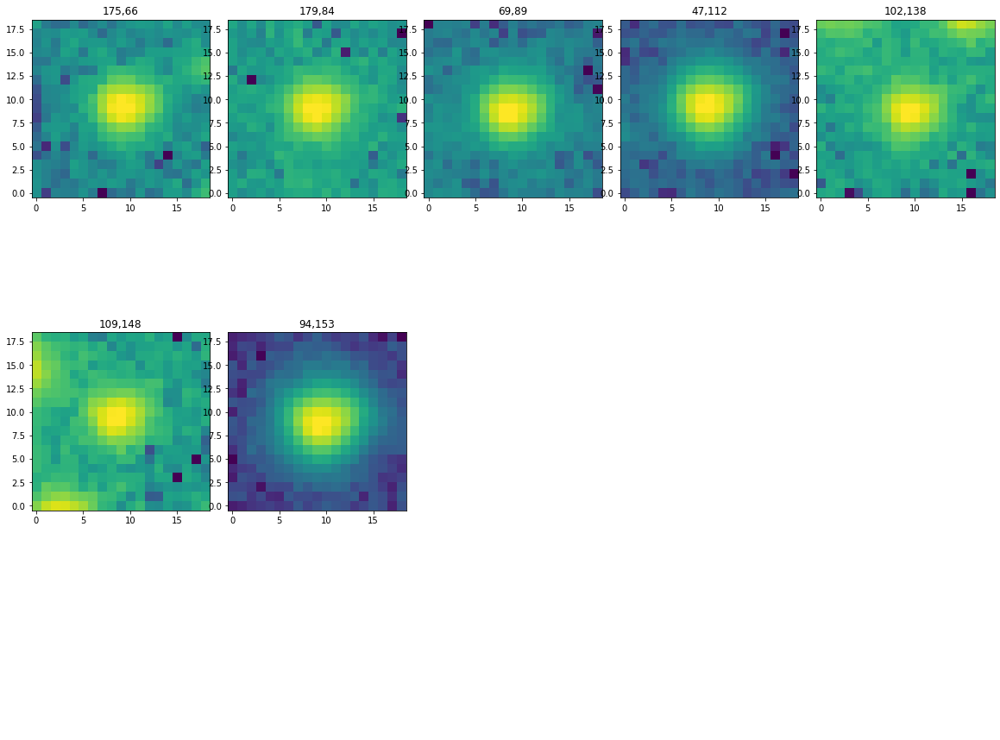

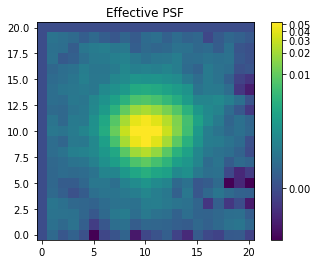

Source: SUM_Aligned_20230309_B_bkgsub.fits
high threshold peaks found: 13 low threshold peaks found: 22
...peaks found post-filtering: 8
Removed some too close to edges, down to 6


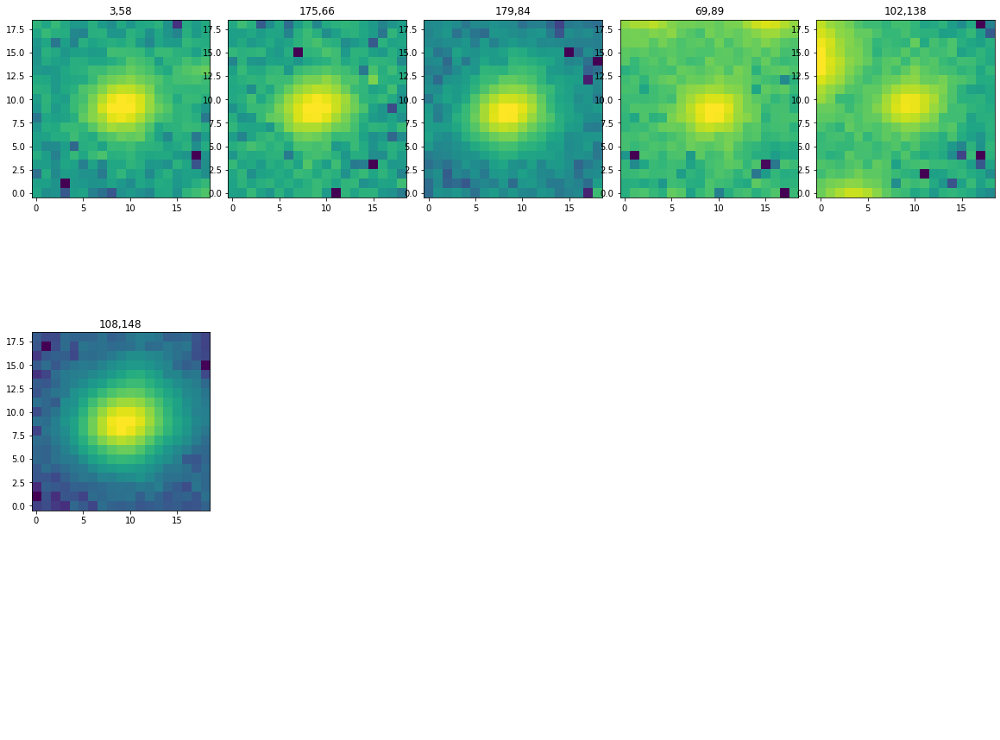

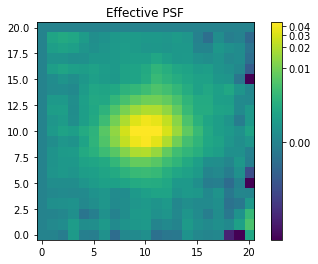

Source: SUM_Aligned_20230310_B_bkgsub.fits
high threshold peaks found: 20 low threshold peaks found: 40
...peaks found post-filtering: 17
Removed some too close to edges, down to 14


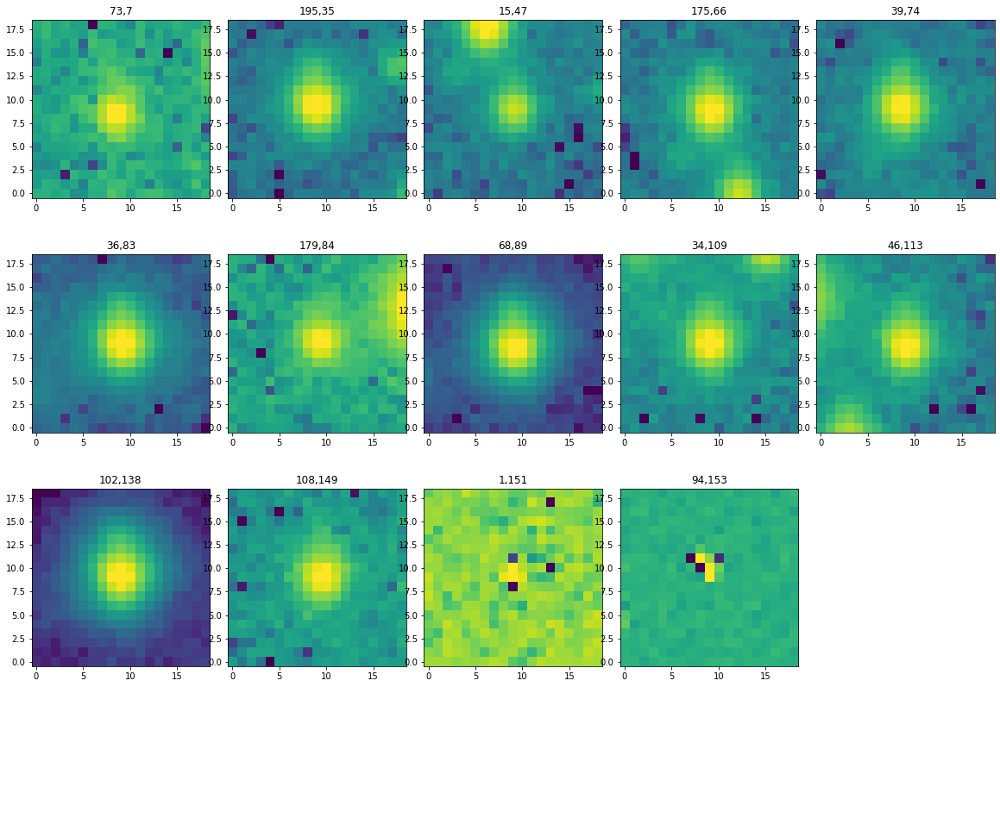

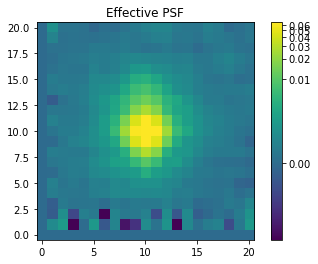

Source: SUM_Aligned_20230311_B_bkgsub.fits
high threshold peaks found: 23 low threshold peaks found: 39
...peaks found post-filtering: 14
Removed some too close to edges, down to 11


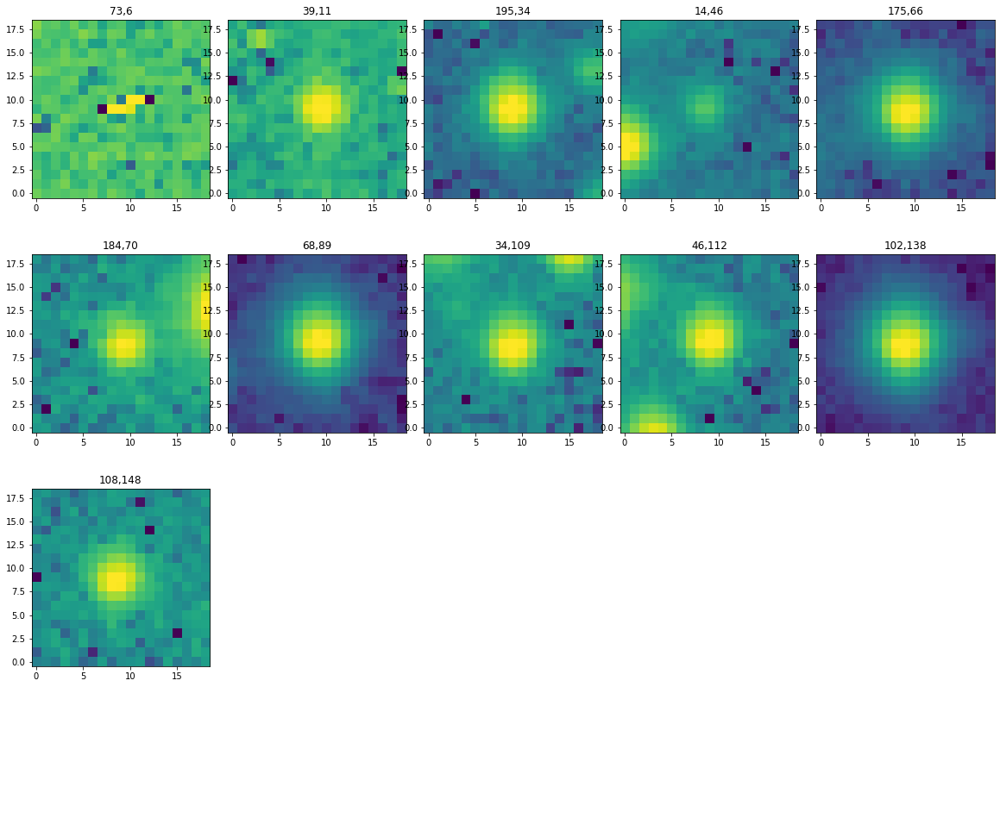

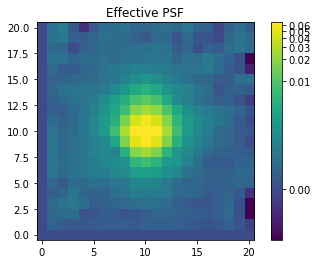

Source: SUM_Aligned_20230312_B_bkgsub.fits
high threshold peaks found: 27 low threshold peaks found: 45
...peaks found post-filtering: 17
Removed some too close to edges, down to 14


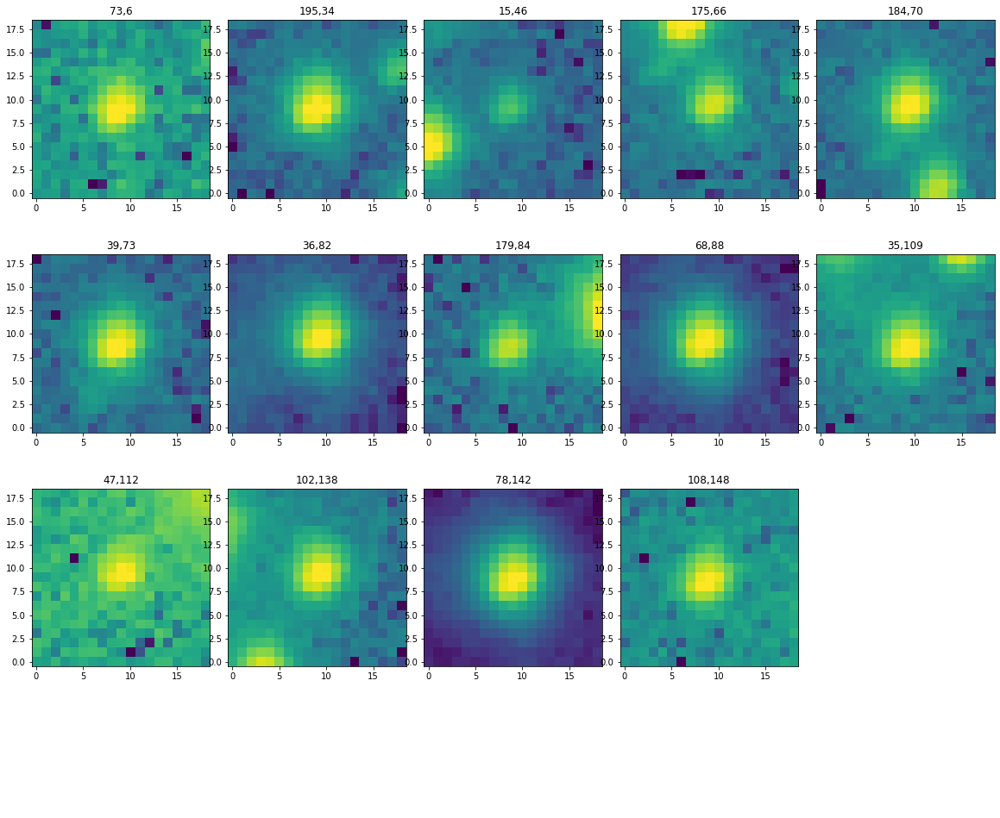

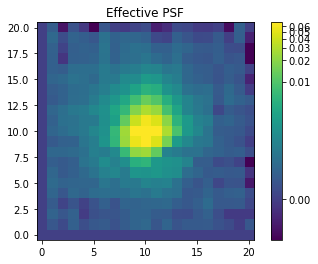

Source: SUM_Aligned_20230313_B_bkgsub.fits
high threshold peaks found: 22 low threshold peaks found: 42
...peaks found post-filtering: 17
Removed some too close to edges, down to 14


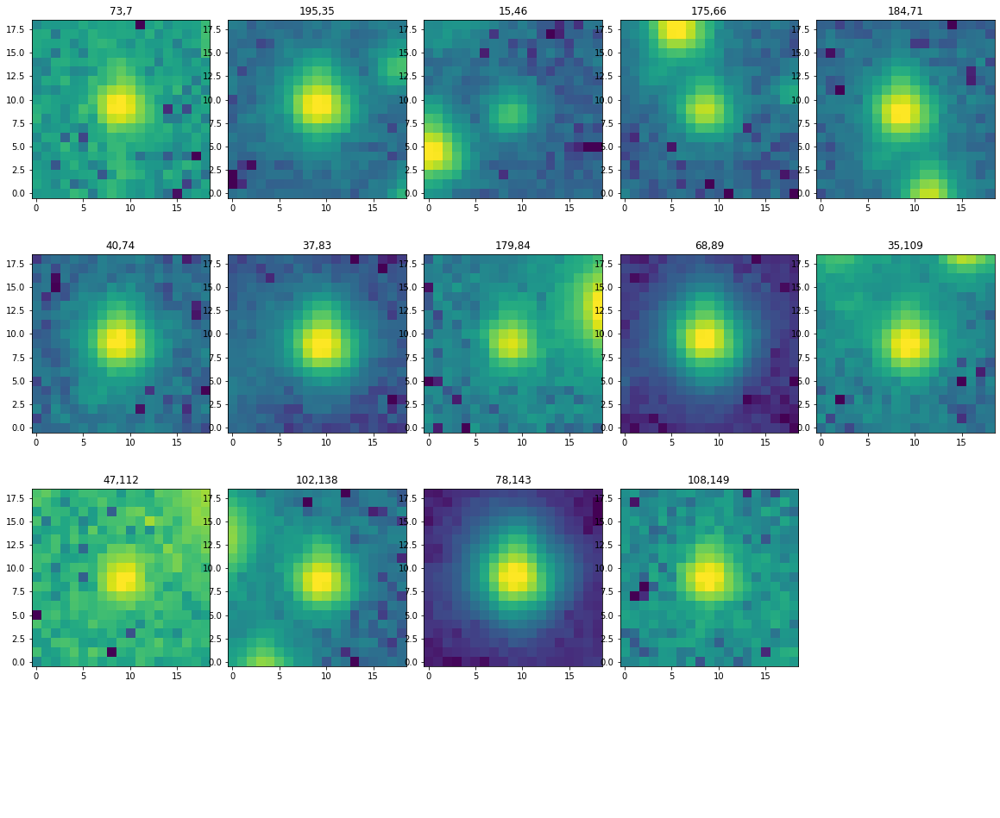

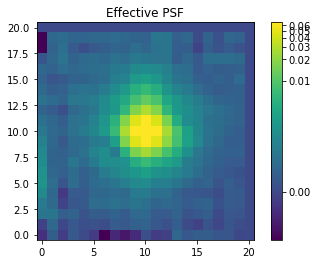

In [20]:
#i=0 # First image for testing

epsf_array=[]
for i in range(len(bkg_subtract_array)-1): # don't need to do the last one, that's reference
    sci_bkg_subtract = fits.open(bkg_subtract_array[i])

    epsf, fitted_stars=BuildePSF(sci_bkg_subtract,high_thresh,low_thresh,bkg_subtract_array[i])
      
    epsf_array.append(epsf)

    # plot it!
    #norm = simple_norm(epsf_array[i].data, 'log', percent=99.0)
    #plt.title("Effective PSF")
    #plt.imshow(epsf_array[i].data, norm=norm, origin='lower', cmap='viridis')
    #plt.colorbar()
    #plt.show()

epsf_array.append(ref_epsf) # for convienience!

Now that we've got all the ePSFs, we can find the best common one between each science-reference pair.

So now we can convolve each science to the reference, and the reference N times to each science. You convolve SOURCE to TARGET, meaning you act on the FIRST entry in create_matching_kernel to get a psf that matches the SECOND entry.

In our first test (ctn), it seemed that always using the reference as the target worked better. But this needs to be investigated further!

In [21]:
window

20

Average STD is  1.5267347253705335 (  1.4158782653285007 1.6375911854125662 ) for source  0
Average STD is  0.7337645344927264 (  0.0858437155156086 1.3816853534698441 ) for source  1
Average STD is  1.2580585832031925 (  1.3252228479255437 1.1908943184808416 ) for source  2
Average STD is  1.298157476031986 (  1.3116655960629773 1.2846493560009946 ) for source  3
Average STD is  3.016397963471277 (  5.902646003760631 0.13014992318192295 ) for source  4
Average STD is  1.283766920156359 (  1.302568874289991 1.2649649660227271 ) for source  5
Average STD is  1.301534925138679 (  1.4120917388046201 1.1909781114727378 ) for source  6
Science higher resolution than reference...


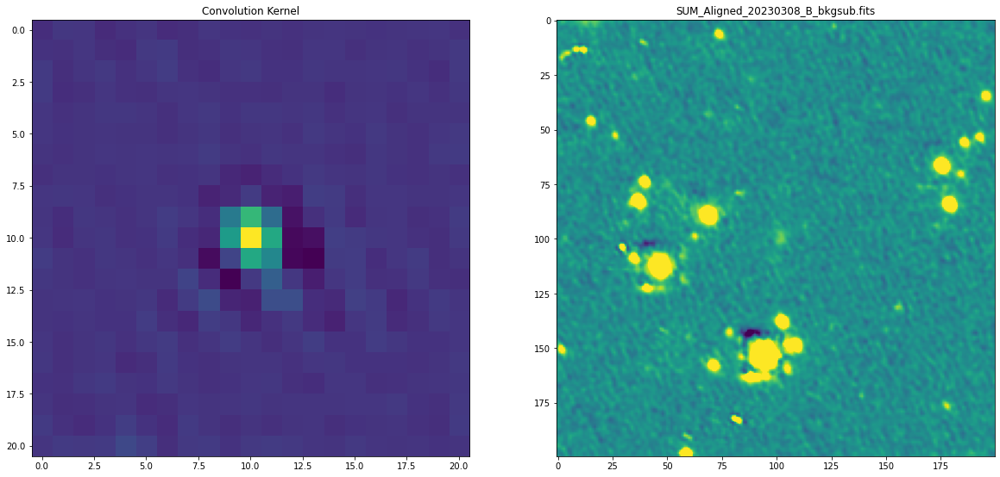

Writing... /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230308_B_bkgsub_conv.fits
Writing (straight reference right now!) /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230308_B_bkgsub_refconv.fits
Science higher resolution than reference...


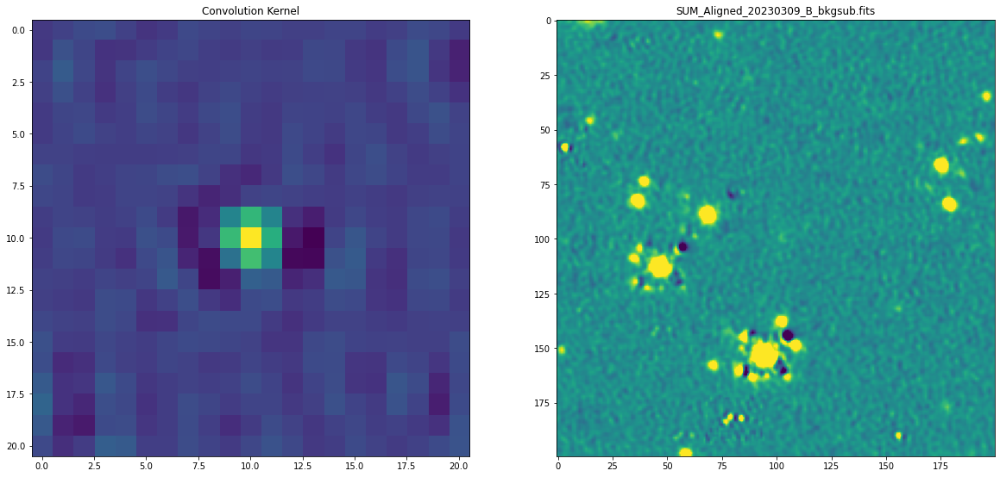

Writing... /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230309_B_bkgsub_conv.fits
Writing (straight reference right now!) /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230309_B_bkgsub_refconv.fits
Science higher resolution than reference...


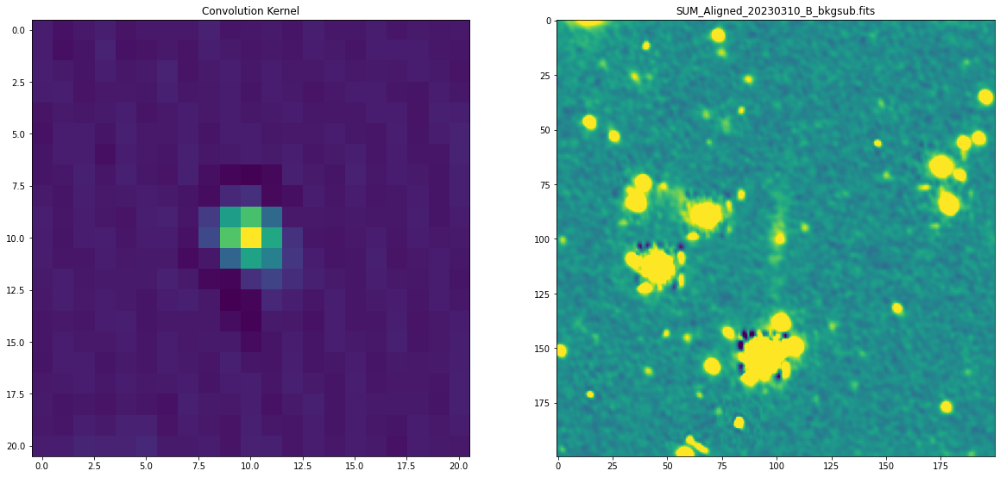

Writing... /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230310_B_bkgsub_conv.fits
Writing (straight reference right now!) /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230310_B_bkgsub_refconv.fits
Science higher resolution than reference...


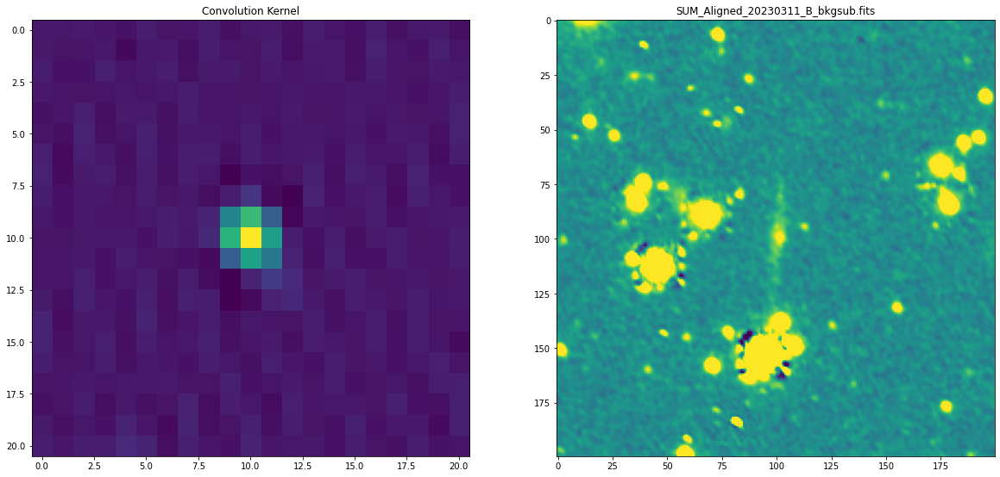

Writing... /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230311_B_bkgsub_conv.fits
Writing (straight reference right now!) /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230311_B_bkgsub_refconv.fits
Science higher resolution than reference...


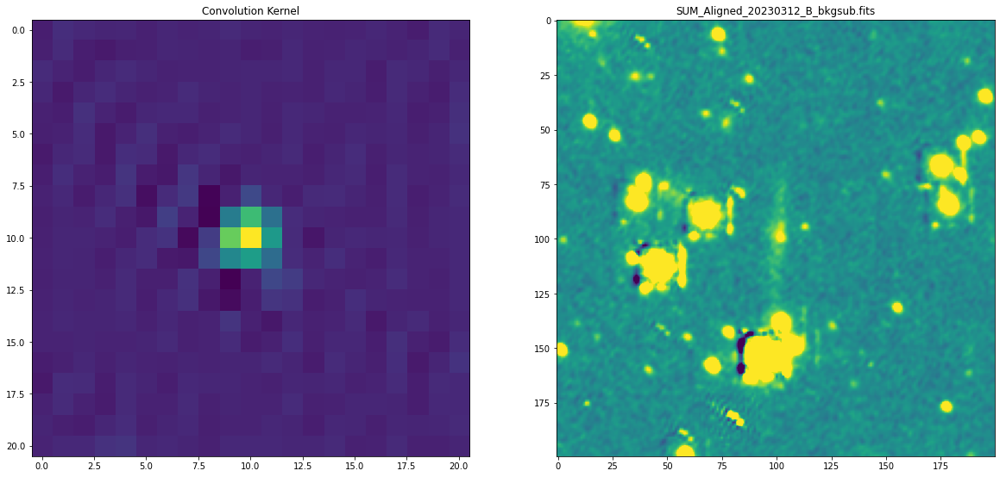

Writing... /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230312_B_bkgsub_conv.fits
Writing (straight reference right now!) /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230312_B_bkgsub_refconv.fits
Science higher resolution than reference...


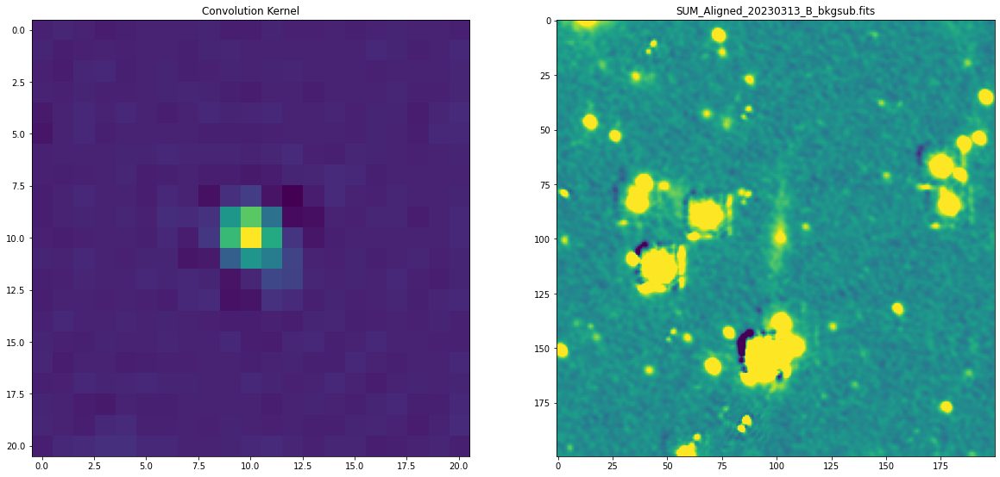

Writing... /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230313_B_bkgsub_conv.fits
Writing (straight reference right now!) /media/cduston/MCARG/AnalyzedSources/SN2023ctn/image_subtraction/processed/SUM_Aligned_20230313_B_bkgsub_refconv.fits


In [22]:
# careful here - says the first (source) kernel must be higher resolution then the second (target)! That's a nightmare, maybe!
from photutils.psf.matching import create_matching_kernel
from photutils.psf.matching import HanningWindow

from astropy.convolution import convolve
from astropy.modeling import models, fitting

# Fit a gaussian to all the ePSFs to determine their size
ave_std=[]
for i in range(len(epsf_array)):
    # Fit the data using a Gaussian
    g_init = models.Gaussian2D(amplitude=np.max(epsf_array[i].data), x_mean=size_of_psf,y_mean=size_of_psf)
    fit_g = fitting.LMLSQFitter()
    x,y=np.mgrid[:epsf_array[i].data.shape[0], :epsf_array[i].data.shape[1]]
    g = fit_g(g_init, x, y,epsf_array[i].data)
    #plt.imshow(g(x,y))
    ave_std.append((g.x_stddev[0]+g.y_stddev[0])/2)
    print("Average STD is ",ave_std[i],"( ",g.x_stddev[0],g.y_stddev[0],") for source ",i)

# Find the best kernel and convolve the science with it.
sci_conv_array=[]
ref_conv_array=[]
# Open the reference and pretend it's convolved
ref_bkg_subtract = fits.open(bkg_subtract_array[len(bkg_subtract_array)-1]) # REFERENCE IS LAST IMAGE
ref_conv=ref_bkg_subtract[0].data
for i in range(len(epsf_array)-1):
    #if (ave_std[i] < ave_std[len(ave_std)-1]): # reference is the target!
    print("Science higher resolution than reference...")
    window=HanningWindow()
    kernel = create_matching_kernel(epsf_array[i].data,epsf_array[len(epsf_array)-1].data,window=window)
    # Do the convolution here!
    bkg_subtract = fits.open(bkg_subtract_array[i])
    sci_conv=convolve(bkg_subtract[0].data,kernel)
    #else: # assuming it's the other way! science is the target!
     #   print("Reference higher resolution than science...")
      #  kernel = create_matching_kernel(epsf_array[len(epsf_array)-1].data,epsf_array[i].data,window=window)
        # If we put this back, do a ref_conv as well.
    
    
    fig, ax = plt.subplots(1, 2, figsize=(20, 20),squeeze=True)
    #ax = ax.ravel()
    ax[0].imshow(kernel)
    ax[0].set_title("Convolution Kernel")
    mean, median, std = sigma_clipped_stats(sci_conv.data)
    ax[1].imshow(sci_conv, vmin=median-10*std, vmax=median+10*std)
    ax[1].set_title(bkg_subtract_array[i])
    #plt.imshow(kernel)
    plt.show()
 
    # write the images
    hdu_sci_conv = fits.PrimaryHDU(sci_conv,bkg_subtract[0].header) # really should be adding header keys!
    sci_conv_array.append(bkg_subtract_array[i].replace(".fits","_conv.fits"))
    sci_conv_name=os.path.join(proc_dir,sci_conv_array[i])
    # Write the images
    print("Writing...",sci_conv_name)
    hdu_sci_conv.writeto(sci_conv_name,overwrite=True)
    
    #For now, just copy the reference into the "convolved reference" spot
    # need one for each SCIENCE image...
    hdu_ref_conv = fits.PrimaryHDU(ref_conv,bkg_subtract[0].header) # header dummy, just a copy of the pre-convolved reference!
    ref_conv_array.append(bkg_subtract_array[i].replace(".fits","_refconv.fits"))
    ref_conv_name=os.path.join(proc_dir,ref_conv_array[i])
    
    # Create the images
    print("Writing (straight reference right now!)",ref_conv_name)
    hdu_ref_conv.writeto(ref_conv_name,overwrite=True)


In [23]:
sci_conv_array

['SUM_Aligned_20230308_B_bkgsub_conv.fits',
 'SUM_Aligned_20230309_B_bkgsub_conv.fits',
 'SUM_Aligned_20230310_B_bkgsub_conv.fits',
 'SUM_Aligned_20230311_B_bkgsub_conv.fits',
 'SUM_Aligned_20230312_B_bkgsub_conv.fits',
 'SUM_Aligned_20230313_B_bkgsub_conv.fits']

In [24]:
ref_conv_array

['SUM_Aligned_20230308_B_bkgsub_refconv.fits',
 'SUM_Aligned_20230309_B_bkgsub_refconv.fits',
 'SUM_Aligned_20230310_B_bkgsub_refconv.fits',
 'SUM_Aligned_20230311_B_bkgsub_refconv.fits',
 'SUM_Aligned_20230312_B_bkgsub_refconv.fits',
 'SUM_Aligned_20230313_B_bkgsub_refconv.fits']

### Improving the alignment
Now that the science image is convolved with (an approximation of) the PSF of the reference image, 
and the reference image is convolved with the PSF of the science image, we can perform the image subtraction.

- Before the subtraction we use an fft method (chi_2_shift) to fine-tune the image alignment of the reference and science image. We'll do this in pairs, reference aligning with science. When we go do photometry with AIJ, this fine tuning doesn't matter so much.

Actually in this version we are going to try *without* improving the alignment - we got small images, instrumental magnitudes, etc...

## Normalization and Subtraction of the images

The science and reference images are usually obtained with different exposure times.  In addition, the reference image can be the stack of several images to increase the depth.  Finally, different CCDs of the same camera (or even different regions of the same CCD when multiple amplifiers are present) may have slightly different gain. <br >

The background subtraction should have removed the non-linear offsets between science and reference images.  We can therefore normalize the two images by computing the ratio of bright star fluxes in the two images. 

So we'll maybe normalize the reference(s) to the science?

old------------------------------

Adding a catalog filter here, to get rid of things with flags over 4.

Have several other types of filters (and debugging info) down there, but no evidence that any of them actually helps anything!

In [25]:
# I think unneeded in the current iteration...
'''

# this here function will find the barycenter of each souce in the segment map and return them all.
# I think x and y are switched here and probably in everything else!
def find_barycenter(segment_map):
    index=[]
    for n in range(segment_map.nlabels):
        xCM=0
        x_no=0
        yCM=0
        y_no=0
        for i in range(len(segment_map.data)):
            for j in range(len(segment_map.data[i])):
                if segment_map.data[i][j] == segment_map.labels[n]:
                    xCM+=i
                    x_no+=1
                    yCM+=j
                    y_no+=1
        #print(xCM/x_no,yCM/y_no)
        index.append([xCM/x_no,yCM/y_no])
    print("sources found at barycenters:",index)
    return index
'''                    

'\n\n# this here function will find the barycenter of each souce in the segment map and return them all.\n# I think x and y are switched here and probably in everything else!\ndef find_barycenter(segment_map):\n    index=[]\n    for n in range(segment_map.nlabels):\n        xCM=0\n        x_no=0\n        yCM=0\n        y_no=0\n        for i in range(len(segment_map.data)):\n            for j in range(len(segment_map.data[i])):\n                if segment_map.data[i][j] == segment_map.labels[n]:\n                    xCM+=i\n                    x_no+=1\n                    yCM+=j\n                    y_no+=1\n        #print(xCM/x_no,yCM/y_no)\n        index.append([xCM/x_no,yCM/y_no])\n    print("sources found at barycenters:",index)\n    return index\n'

In [26]:
# Also unneeded
'''
# cleaning - do this before matching, I think.
# Catalog expected is catalog filename from sextractor.
# Nah, I think this has to be done as ASCII to match the rest of the code!
# Maybe read it in twice - once to get the header (as "basic"), and once to get the data (as "sextractor").
# For the flags we need the sextractor format, while for the data we need ascii.
# so we will probably have to write as ascii....or correlate the rows between the two?
def clean_cat(catalog):
    cat_sci_sex = ascii.read(catalog,format='sextractor')
    cat_sci_basic = ascii.read(catalog,format='no_header') 
    print("Initial catalog length: ",len(cat_sci_sex),",",len(cat_sci_basic)," (for debug, should be the same!)")
    j=0
    for i in reversed(range(len(cat_sci_sex))): #loop backwards in sextractor catalog so we can remove rows
        if cat_sci_sex['FLAGS'][i]>=4:
            cat_sci_basic.remove_row(i) # remove the row in the basic catalog
        if cat_sci_sex['FLUX_AUTO'][i]<=0: # remove if flux drops below zero
            cat_sci_basic.remove_row(i) # remove the row in the basic catalog
        j=j+1
        #print(j)
    print("Filtered down to length:", len(cat_sci_basic))
    cat_sci_basic.write(catalog,overwrite=True,format='ascii.no_header') # hope the headers get written?
'''

'\n# cleaning - do this before matching, I think.\n# Catalog expected is catalog filename from sextractor.\n# Nah, I think this has to be done as ASCII to match the rest of the code!\n# Maybe read it in twice - once to get the header (as "basic"), and once to get the data (as "sextractor").\n# For the flags we need the sextractor format, while for the data we need ascii.\n# so we will probably have to write as ascii....or correlate the rows between the two?\ndef clean_cat(catalog):\n    cat_sci_sex = ascii.read(catalog,format=\'sextractor\')\n    cat_sci_basic = ascii.read(catalog,format=\'no_header\') \n    print("Initial catalog length: ",len(cat_sci_sex),",",len(cat_sci_basic)," (for debug, should be the same!)")\n    j=0\n    for i in reversed(range(len(cat_sci_sex))): #loop backwards in sextractor catalog so we can remove rows\n        if cat_sci_sex[\'FLAGS\'][i]>=4:\n            cat_sci_basic.remove_row(i) # remove the row in the basic catalog\n        if cat_sci_sex[\'FLUX_AUTO

In [27]:
# Also don't need...
'''
# this here function will identify which source number in the segment map is closest to the last one found
def find_source_index(segment_map,last_source_bary):
    index_list=find_barycenter(segment_map)
    # distance to the first....
    dist=(last_source_bary[0]-index_list[0][0])**2+(last_source_bary[1]-index_list[0][1])**2
    print("distance debug:",last_source_bary[0],index_list[0][0],last_source_bary[1],index_list[0][1],dist)
    source_no_res=1
    for n in range(1,len(index_list)):
        dist1=(last_source_bary[0]-index_list[n][0])**2+(last_source_bary[1]-index_list[n][1])**2
        print(n,dist,dist1,source_no_res)
        if dist1 < dist:
            dist = dist1
            source_no_res=n+1
    return source_no_res,index_list[source_no_res-1]
'''

'\n# this here function will identify which source number in the segment map is closest to the last one found\ndef find_source_index(segment_map,last_source_bary):\n    index_list=find_barycenter(segment_map)\n    # distance to the first....\n    dist=(last_source_bary[0]-index_list[0][0])**2+(last_source_bary[1]-index_list[0][1])**2\n    print("distance debug:",last_source_bary[0],index_list[0][0],last_source_bary[1],index_list[0][1],dist)\n    source_no_res=1\n    for n in range(1,len(index_list)):\n        dist1=(last_source_bary[0]-index_list[n][0])**2+(last_source_bary[1]-index_list[n][1])**2\n        print(n,dist,dist1,source_no_res)\n        if dist1 < dist:\n            dist = dist1\n            source_no_res=n+1\n    return source_no_res,index_list[source_no_res-1]\n'

Building PSF for Science Image...
Source: SUM_Aligned_20230308_B_bkgsub_conv.fits
high threshold peaks found: 15 low threshold peaks found: 32
...peaks found post-filtering: 11
Removed some too close to edges, down to 10


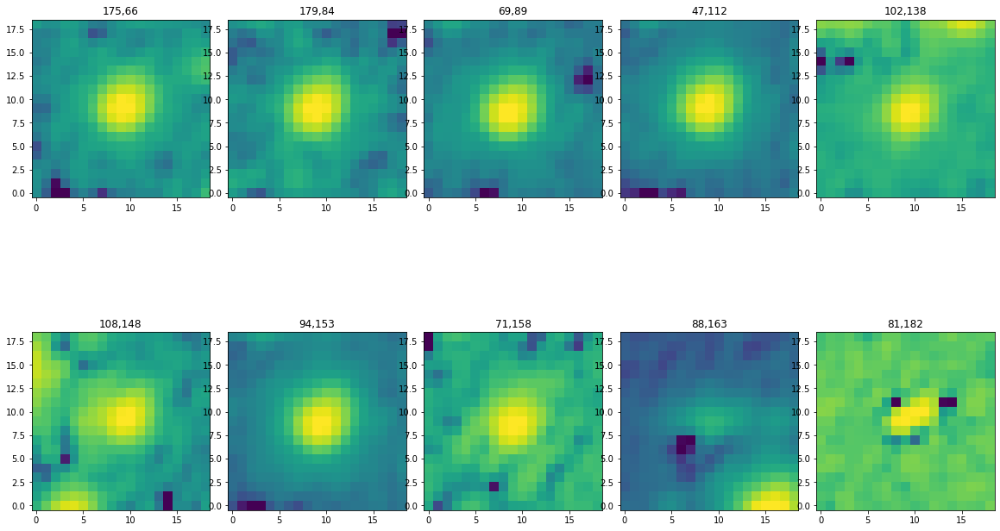

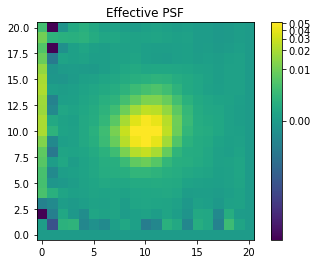

Building PSF for Reference Image...
Source: SUM_Aligned_20230308_B_bkgsub_refconv.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


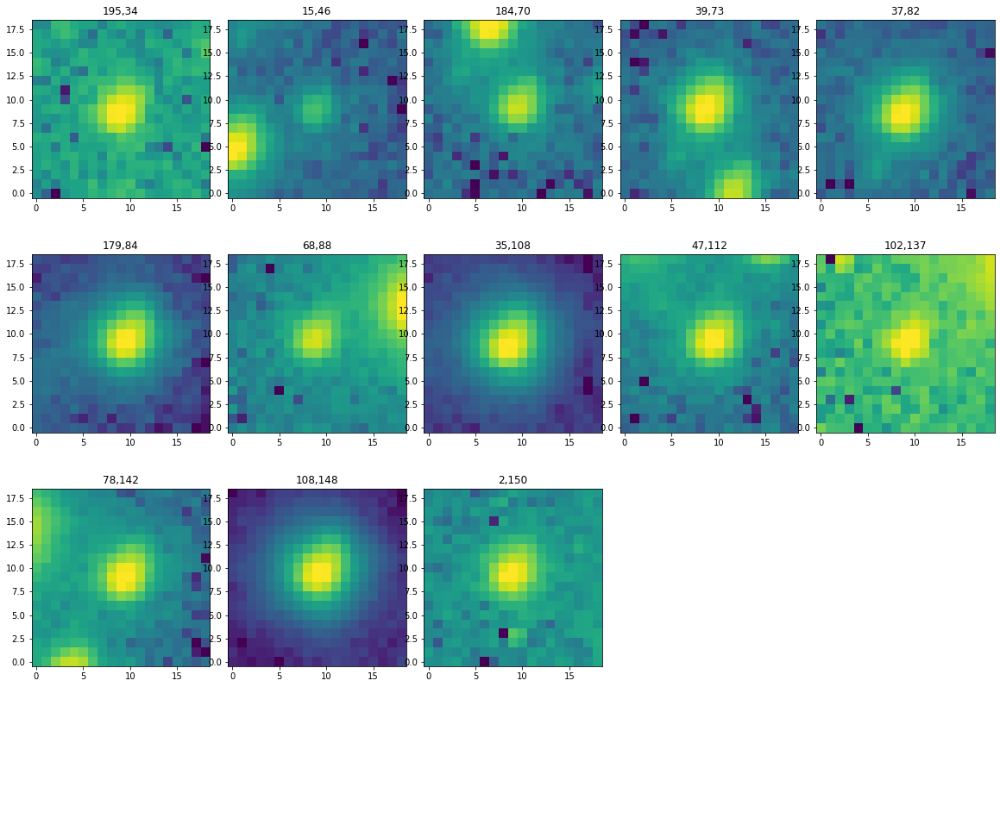

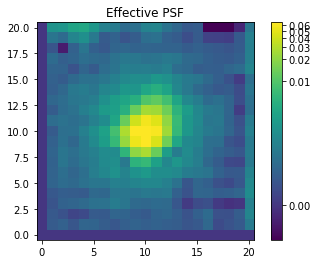

removing... (array([], dtype=int64),)


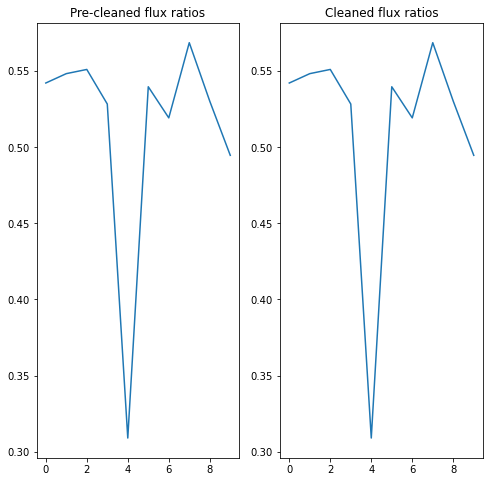

The scaling factor is 0.5349897019642307 average: 0.5131621862687537  deivation 0.07063860512021795
Alignment offsets: 0.15000000000000568 0.3499999999999943 0.0 0.0


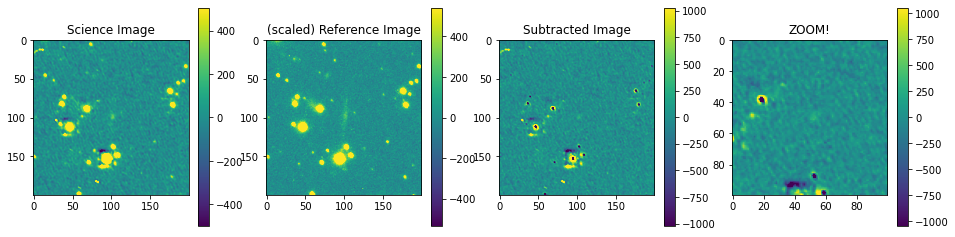

Building PSF for Science Image...
Source: SUM_Aligned_20230309_B_bkgsub_conv.fits
high threshold peaks found: 11 low threshold peaks found: 35
...peaks found post-filtering: 6
Removed some too close to edges, down to 4


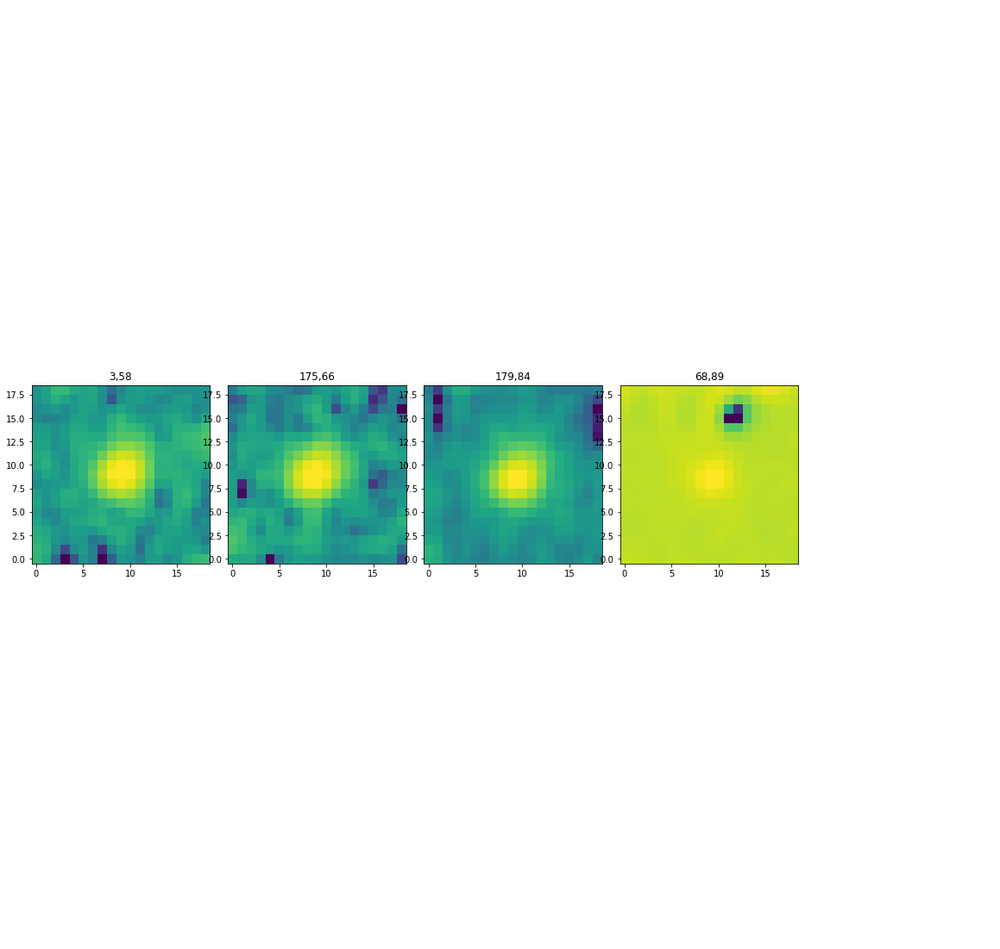

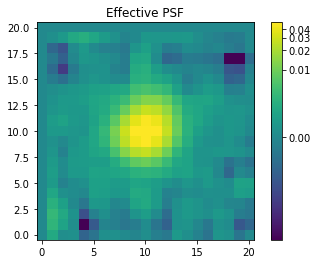

Building PSF for Reference Image...
Source: SUM_Aligned_20230309_B_bkgsub_refconv.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


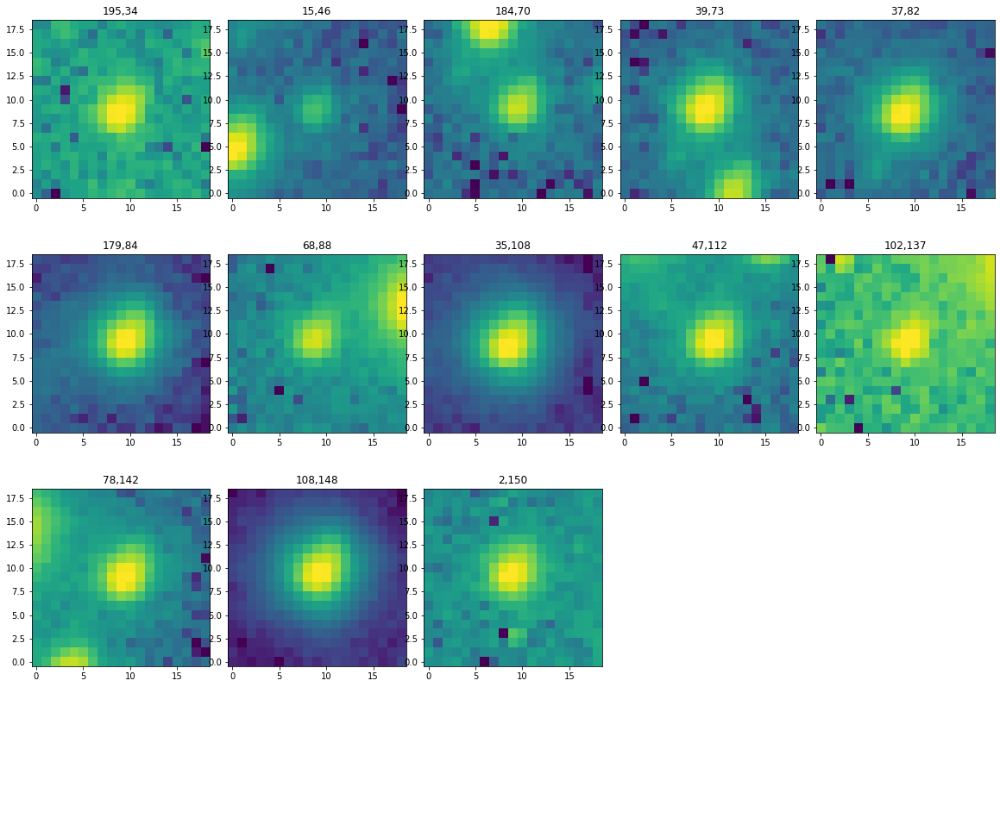

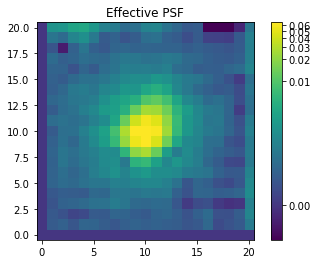

removing... (array([], dtype=int64),)


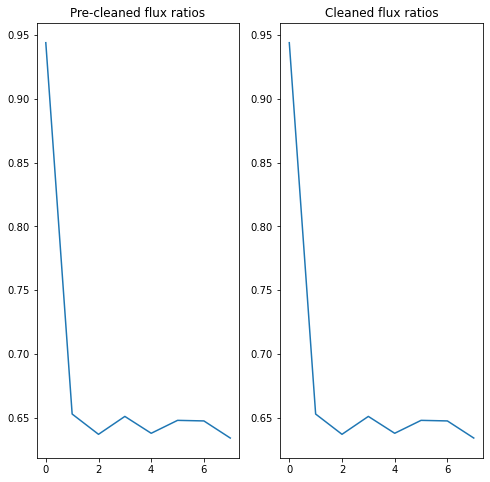

The scaling factor is 0.6478371244836093 average: 0.6816206301574087  deivation 0.09932256427514706
Alignment offsets: -0.04999999999999716 0.3499999999999943 0.0 0.0


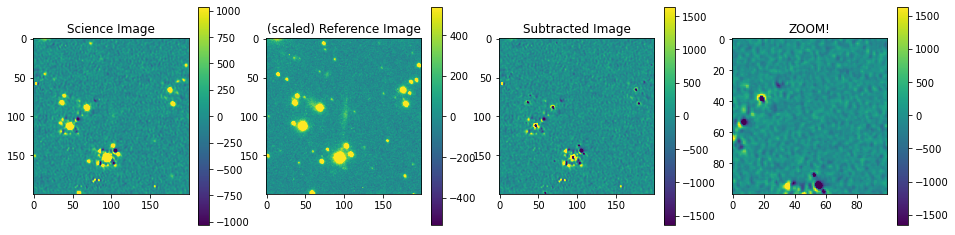

Building PSF for Science Image...
Source: SUM_Aligned_20230310_B_bkgsub_conv.fits
high threshold peaks found: 27 low threshold peaks found: 53
...peaks found post-filtering: 17
Removed some too close to edges, down to 14


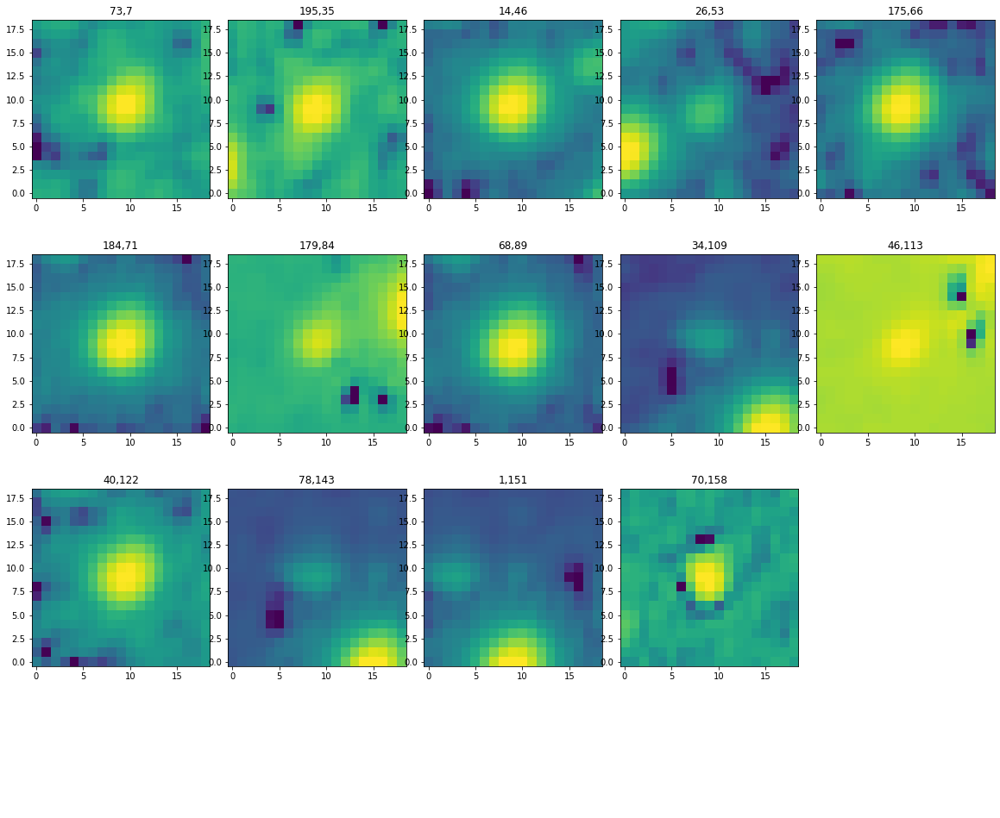

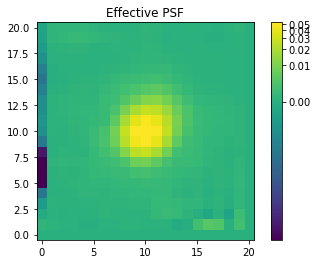

Building PSF for Reference Image...
Source: SUM_Aligned_20230310_B_bkgsub_refconv.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


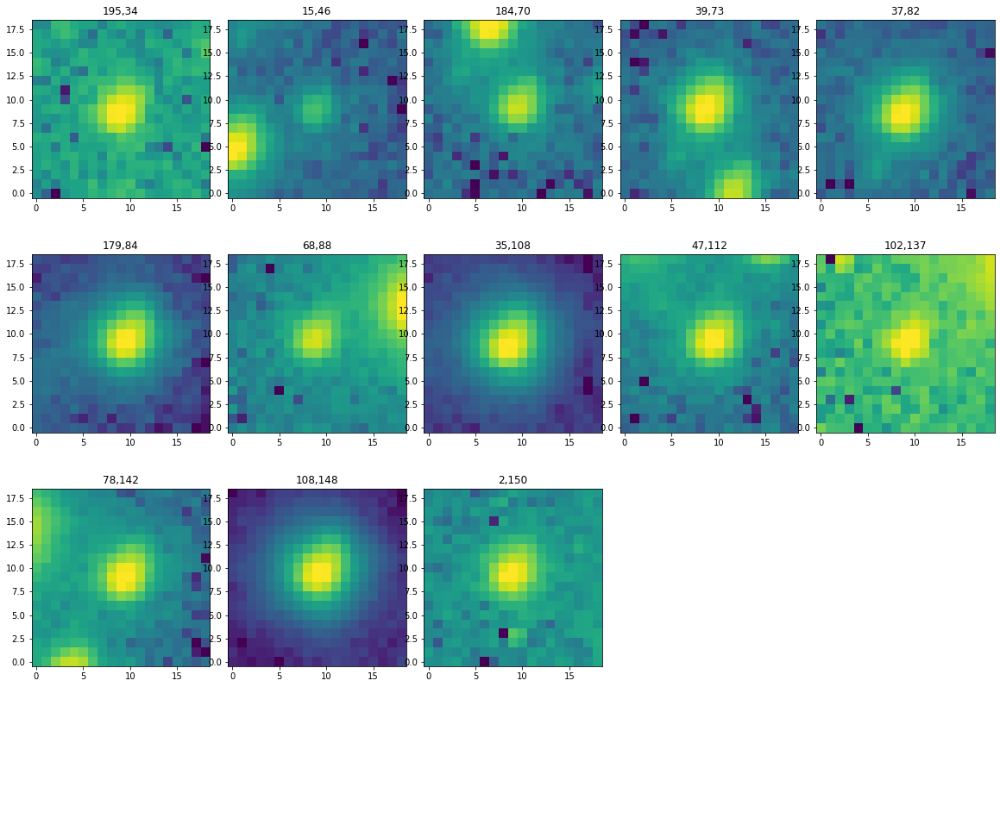

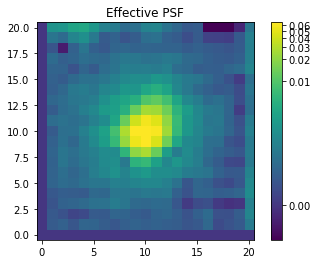

removing... (array([17]),)


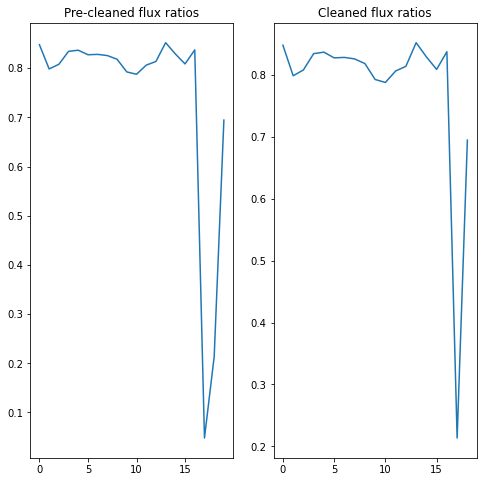

The scaling factor is 0.8182029246912965 average: 0.7820916259215732  deivation 0.13801344501858
Alignment offsets: -0.3499999999999943 0.6500000000000057 0.0 0.0


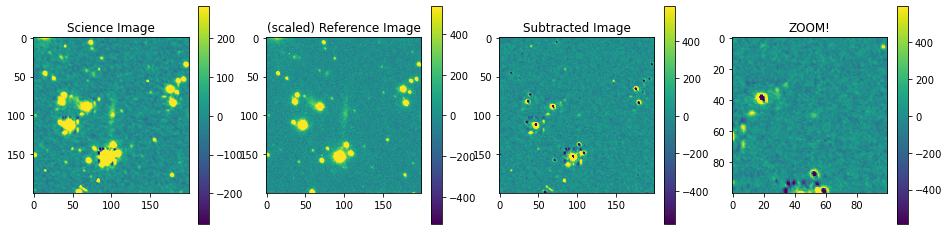

Building PSF for Science Image...
Source: SUM_Aligned_20230311_B_bkgsub_conv.fits
high threshold peaks found: 29 low threshold peaks found: 56
...peaks found post-filtering: 13
Removed some too close to edges, down to 10


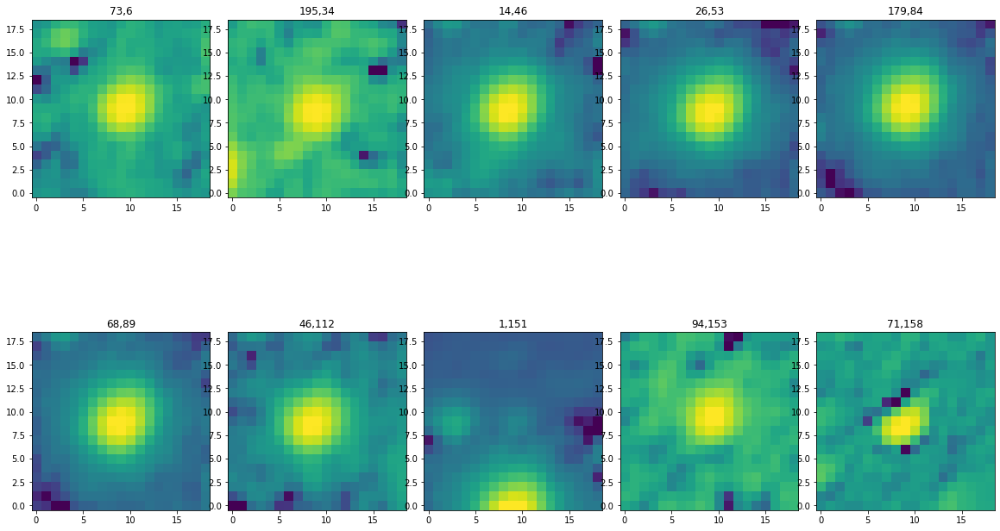

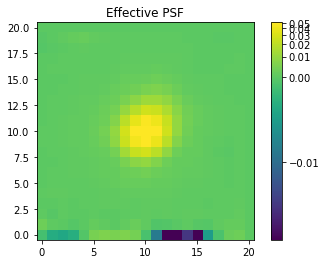

Building PSF for Reference Image...
Source: SUM_Aligned_20230311_B_bkgsub_refconv.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


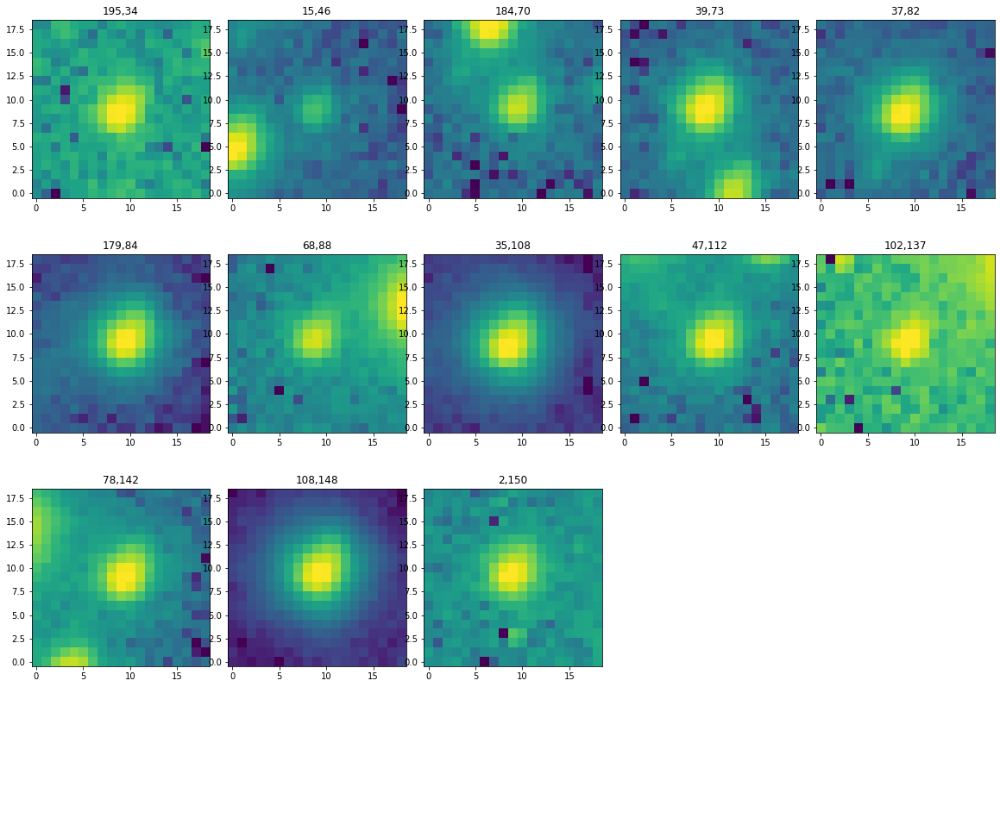

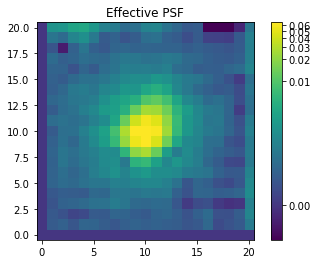

removing... (array([], dtype=int64),)


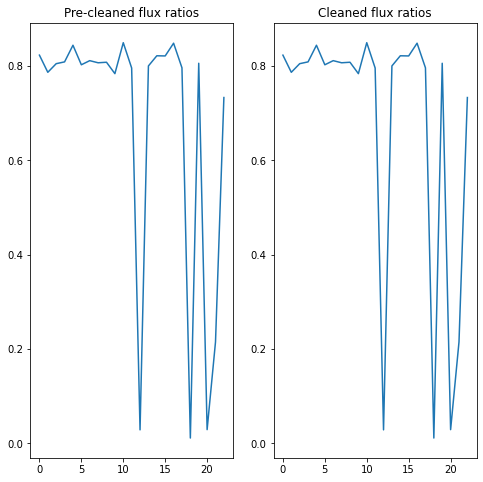

The scaling factor is 0.8052162486562473 average: 0.6800563894807041  deivation 0.2825520233607127
Alignment offsets: -0.3499999999999943 0.3499999999999943 0.0 0.0


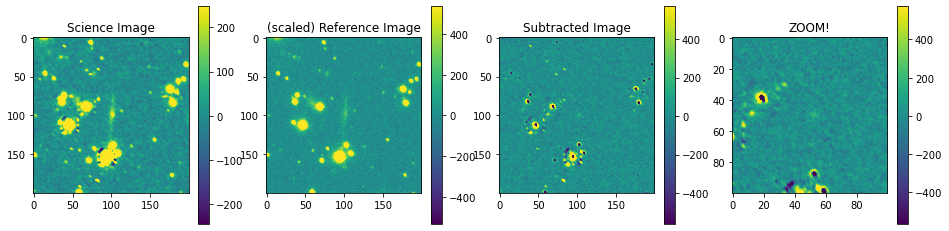

Building PSF for Science Image...
Source: SUM_Aligned_20230312_B_bkgsub_conv.fits
high threshold peaks found: 31 low threshold peaks found: 56
...peaks found post-filtering: 21
Removed some too close to edges, down to 17


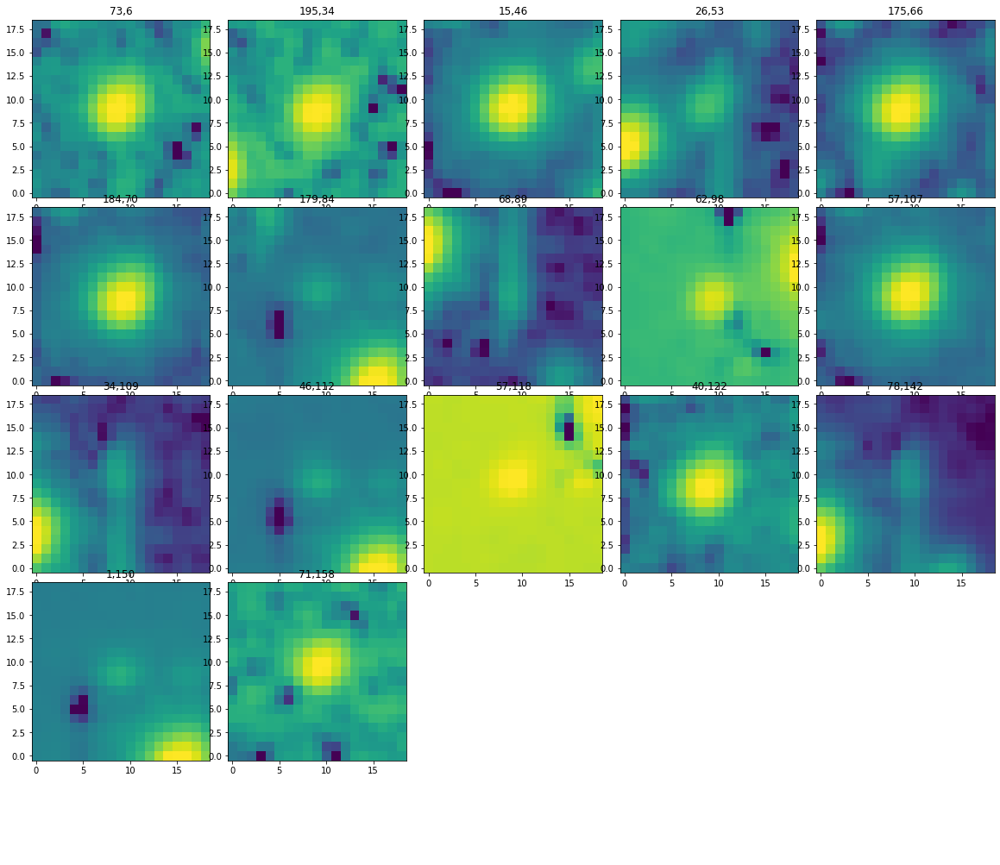

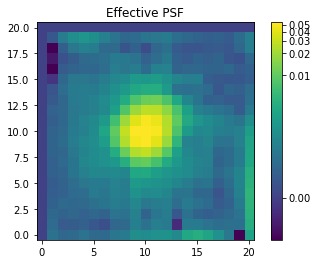

Building PSF for Reference Image...
Source: SUM_Aligned_20230312_B_bkgsub_refconv.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


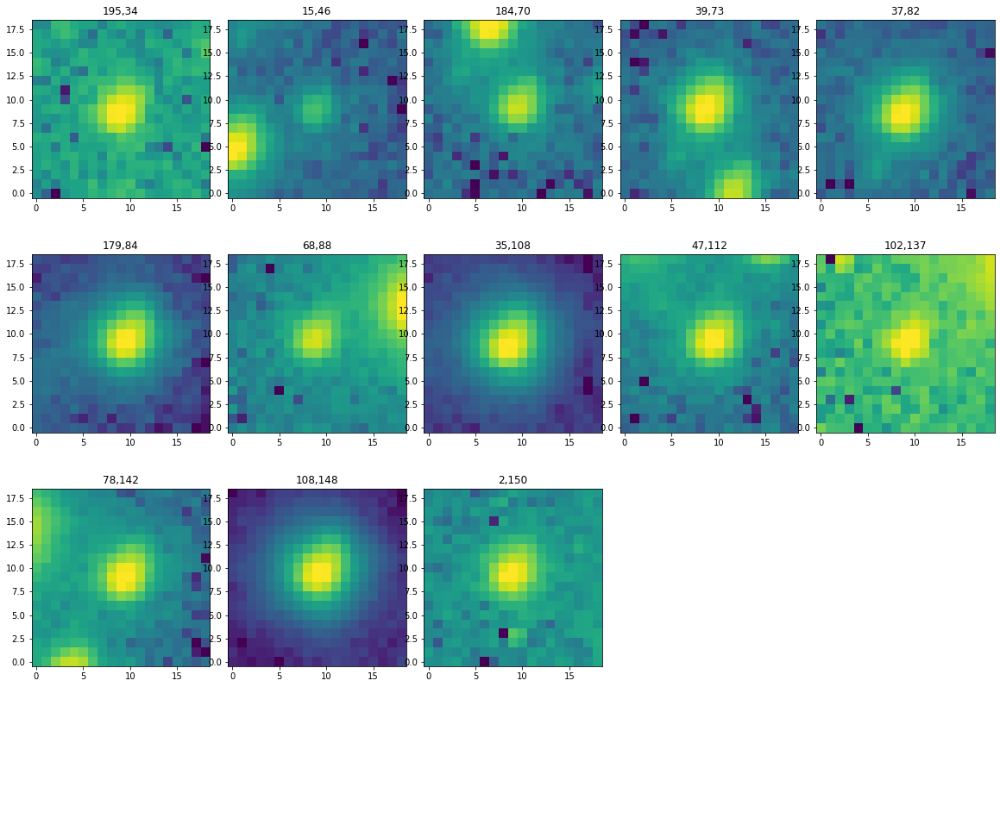

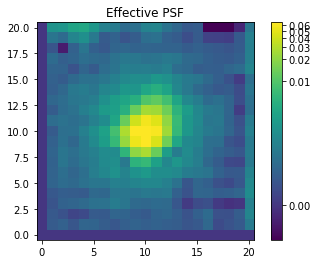

removing... (array([], dtype=int64),)


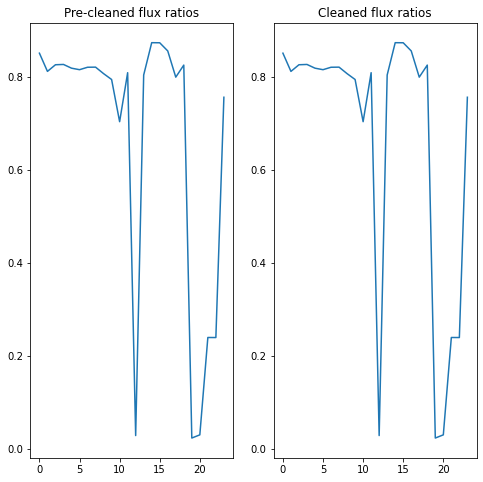

The scaling factor is 0.8109890329910718 average: 0.669436753315241  deivation 0.2915773375344983
Alignment offsets: -0.25 0.25 0.0 0.0


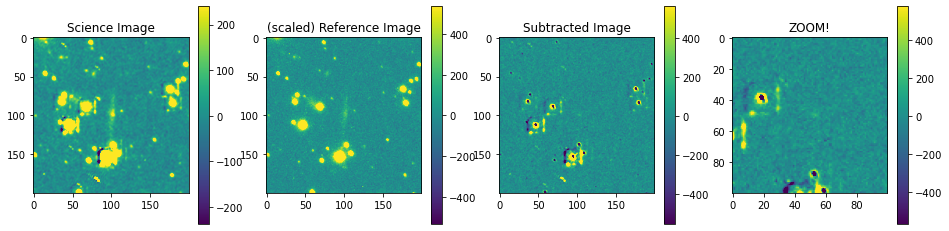

Building PSF for Science Image...
Source: SUM_Aligned_20230313_B_bkgsub_conv.fits
high threshold peaks found: 34 low threshold peaks found: 62
...peaks found post-filtering: 19
Removed some too close to edges, down to 15


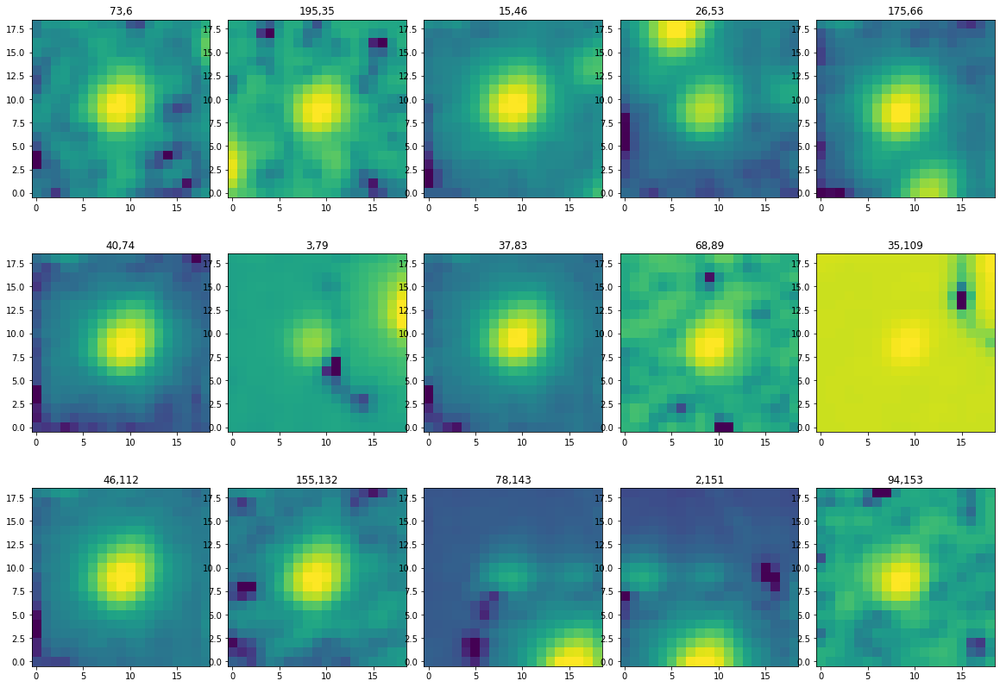

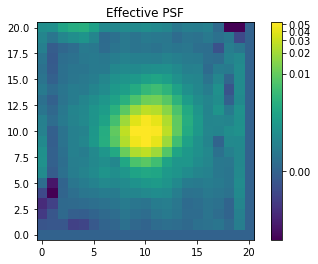

Building PSF for Reference Image...
Source: SUM_Aligned_20230313_B_bkgsub_refconv.fits
high threshold peaks found: 20 low threshold peaks found: 34
...peaks found post-filtering: 16
Removed some too close to edges, down to 13


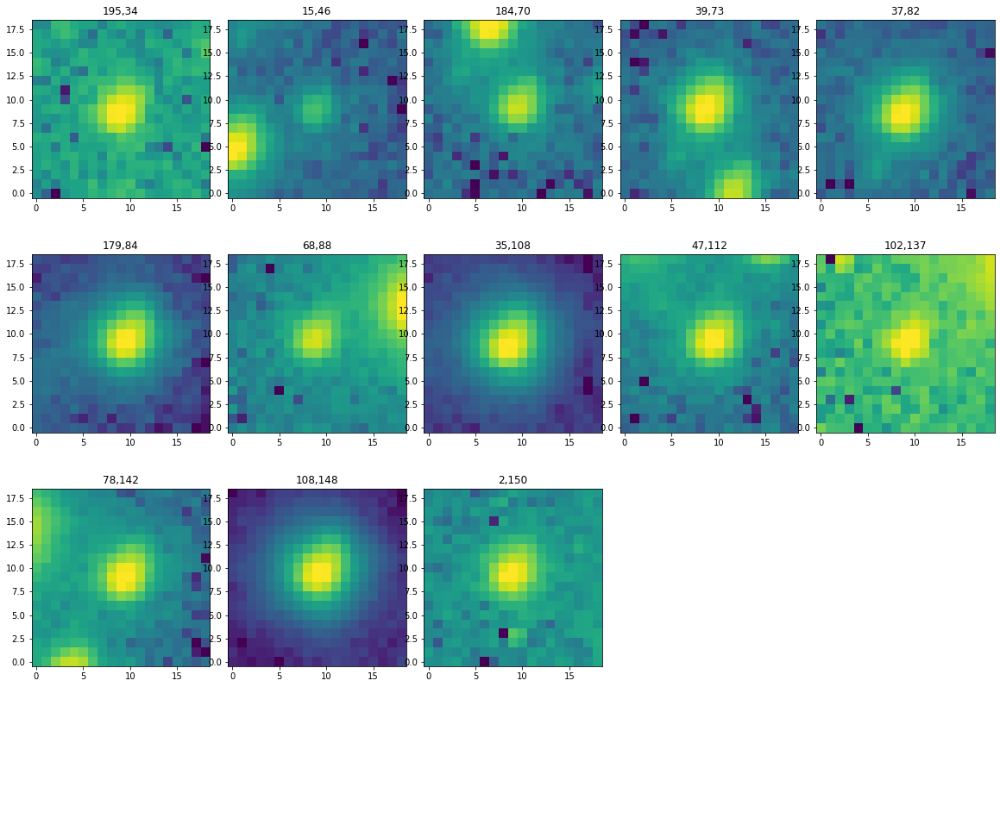

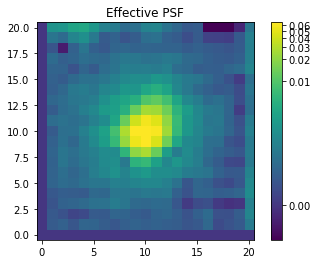

removing... (array([], dtype=int64),)


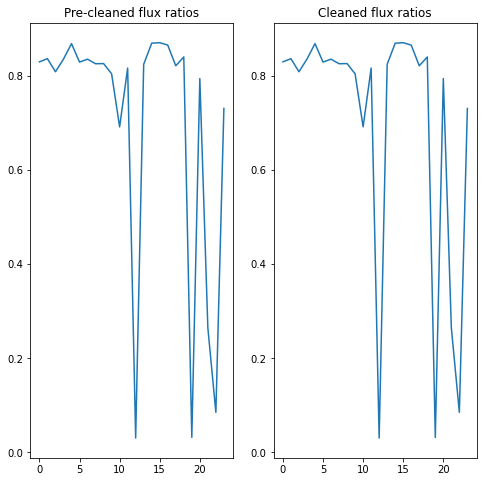

The scaling factor is 0.825073457476875 average: 0.7014962891376003  deivation 0.27322065481087515
Alignment offsets: -0.04999999999999716 0.5499999999999972 0.0 0.0


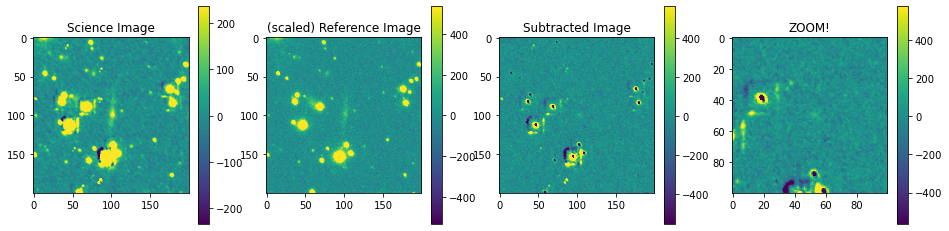

In [28]:
sub_array=[]
epsf_array=[] # array for storing the effective PSFs of each convolved image.

for i in range(len(sci_conv_array)):
    sci_conv = fits.open(sci_conv_array[i])

    # Going to extract sources and get fluxes for normalization
    # I guess I think the ePSF is again the right thing to do here.
    print("Building PSF for Science Image...")
    epsf, fitted_stars=BuildePSF(sci_conv,high_thresh,low_thresh,sci_conv_array[i])
    epsf_array.append(epsf)
    
    # now use that psf to extract the fluxes.
    fit_shape = (size_of_psf,size_of_psf)
    threshold = detect_threshold(sci_conv[0].data, nsigma=high_thresh, sigma_clip=sigma_clip)
    finder = DAOStarFinder(np.max(threshold), 2.0) # this is a totally fake step...how to get that absolute treshold value?!
    psfphot = PSFPhotometry(epsf, fit_shape,aperture_radius=init_rad,finder=finder)
    sci_phot = psfphot(sci_conv[0].data)

    # now run the same thing on the reference
    ref_conv= fits.open(ref_conv_array[i])
    # Going to extract sources and get fluxes for normalization
    # I guess I think the ePSF is again the right thing to do here.
    print("Building PSF for Reference Image...")
    epsf, fitted_stars=BuildePSF(ref_conv,high_thresh,low_thresh,ref_conv_array[i])
    # This psf should be used to extract the sources later!
    # now use that psf to extract the fluxes.
    fit_shape = (size_of_psf,size_of_psf)
    threshold = detect_threshold(ref_conv[0].data, nsigma=high_thresh, sigma_clip=sigma_clip)
    finder = DAOStarFinder(np.max(threshold), 2.0) # this is a totally fake step...how to get that absolute treshold value?!
    psfphot = PSFPhotometry(epsf, fit_shape,aperture_radius=init_rad,finder=finder)
    ref_phot = psfphot(ref_conv[0].data)

    # Now do the catalog matching - do I still have the WCS after all this time?
    w_sci = WCS(sci_conv[0].header)
    sky_sci = w_sci.pixel_to_world(sci_phot['x_fit'],sci_phot['y_fit'])
    w_ref = WCS(ref_conv[0].header)
    sky_ref = w_ref.pixel_to_world(ref_phot['x_fit'],ref_phot['y_fit'])
    #coord = SkyCoord(ra=RA * u.deg, dec=Dec * u.deg, frame='icrs')
    #c_sci = SkyCoord(ra=sci_phot['x_fit'], dec=sci_phot['y_fit'])
    #c_ref = SkyCoord(ra=cat_ref['X_WORLD'], dec=cat_ref['Y_WORLD'])
    
    # idx is index of sky_ref that's closest to each sky_sci
    idx, d2d, d3d = sky_sci.match_to_catalog_3d(sky_ref)

    # Initialize a list for the indexes and one for the flux ratios
    # for each (sci, ref) pair, don't need to save all this?
    index_arr = []
    ratio_arr = []

    # for debugging
    sci_list=[]
    ref_list=[]
    
    # Sure don't need to be printing all this stuff! Is there a final normalization i can use for checking?
    for j, i2, d in zip(idx, np.arange(len(d2d)),d2d):
        # for debugging #
        #print("Image coordinates | separation")
        #print(ref_phot[j]['x_fit'],ref_phot[j]['y_fit'],'  ',sci_phot[i2]['x_fit'],sci_phot[i2]['y_fit'],d)
    
        # For debugging
        #print(j,i2)
        sci_list.append(ref_phot[j]['flux_fit'])
        ref_list.append(sci_phot[i2]['flux_fit'])
        
        ratio_arr.append(sci_phot[i2]['flux_fit'] / ref_phot[j]['flux_fit']) # Ratio of SCI/REF!
    
    #
    # Current thought is the issue is here - the median vs mean of the scaling factors are vastly
    # different (factor of 4) as opposed to the case for dpj, when they are like 0.9-1.1. 
    # Maybe going back and carrying around a correct value of the saturate keyword will help?
    # another alternative is to go back to the background of the reference image - it's just worse!
    #
    
    
    if (eliminate_outliers_flag==1):
        fig, axs = plt.subplots(1, 2,figsize=(8,8))
        im0=axs[0].set_title('Pre-cleaned flux ratios')
        im0=axs[0].plot(ratio_arr)
        remove = np.where( (ratio_arr>np.average(ratio_arr)+3*np.std(ratio_arr)) | (ratio_arr<np.average(ratio_arr)-3*np.std(ratio_arr)))
        print("removing...",remove)
        ratio_arr = np.delete(ratio_arr, remove)
        #for i in reversed(range(len(ratio_arr))): # this should go backward...
        #    print(ratio_arr[i],np.average(ratio_arr),np.std(ratio_arr))
        #    if ( ratio_arr[i]>np.average(ratio_arr)+3*np.std(ratio_arr) ) or ( ratio_arr[i]<np.average(ratio_arr)-3*np.std(ratio_arr) ):
        #        print("eliminating ratio:", ratio_arr[i])
        #        ratio_arr[i].remove()
        im1=axs[1].set_title('Cleaned flux ratios')
        im1=axs[1].plot(ratio_arr)
        plt.show()
    
    scale = np.median(ratio_arr)
    #scale=np.average(ratio_arr) # changing to average didn't seem to help
    print("The scaling factor is", scale,"average:",np.average(ratio_arr)," deivation",np.std(ratio_arr))

    # Offset calculation might go here, if we decide to implement it.
    # fine tune the alignment here - at least without this, the alginment is terrible!
    xoff, yoff, exoff, eyoff = chi2_shift(ref_conv[0].data, sci_conv[0].data, 10, return_error=True, upsample_factor=10)
    print("Alignment offsets:",xoff,yoff,exoff,eyoff)
    sci_image_shift = scipy.ndimage.shift(sci_conv[0].data, [-yoff, -xoff], order=3, mode='reflect', cval=0.0, prefilter=True)
 
    #sci_image_shift=sci_conv[0].data
    ref_image_shift=ref_conv[0].data  
   
    # image subtraction step
    # Rescale the reference image to the science and perform the image subtraction.
    #image_sub=sci_image_shift-ref_image_shift*scale
    
    # WAIT WAIT - normalize everything to the reference?!
    image_sub = sci_image_shift/scale - ref_image_shift
    
    
    #plot step for evaluation
    # JEsus christ, we have to get the titles in before the imshow command or the colorbar doens't know what to do!
    fig, axs = plt.subplots(1, 4,figsize=(16,16))
    im0=axs[0].set_title('Science Image')
    mean, median, std = sigma_clipped_stats(sci_image_shift)
    im0=axs[0].imshow(sci_image_shift, vmin=median-10*std, vmax=median+10*std)
    fig.colorbar(im0,ax=axs[0],shrink=0.25)
    #plt.show()
    
    im1=axs[1].set_title('(scaled) Reference Image')
    mean, median, std = sigma_clipped_stats(ref_image_shift)
    im1=axs[1].imshow(ref_image_shift, vmin=median-10*std, vmax=median+10*std)
    #im1=axs[1].imshow(scale*ref_image_shift)
    fig.colorbar(im1,ax=axs[1],shrink=0.25)
    #plt.show()
    
    im2=axs[2].set_title('Subtracted Image')
    #x,y=w.world_to_pixel(coord)
    mean, median, std = sigma_clipped_stats(image_sub)
    im2=axs[2].imshow(image_sub, vmin=median-10*std, vmax=median+10*std)
    #im2=axs[2].scatter(window, window, marker='o', color='r', facecolors='none',s=1000,linewidths=2)
    #axs[2].colorbar(shrink = 0.4)
    fig.colorbar(im2,ax=axs[2],shrink=0.25)

    im3=axs[3].set_title('ZOOM!')
    image_crop=image_sub[int(1/4*image_sub.data.shape[0]):int(3/4*image_sub.data.shape[0]),int(1/4*image_sub.data.shape[1]):int(3/4*image_sub.data.shape[1])]
    mean, median, std = sigma_clipped_stats(image_crop)
    im3=axs[3].imshow(image_crop, vmin=median-10*std, vmax=median+10*std)
    fig.colorbar(im3,ax=axs[3],shrink=0.25)
    plt.show()
    #plt.tight_layout(h_pad=1)
    
    #image_sub=sci_image_shift-synthetic_image*scale
    hdu_image_sub = fits.PrimaryHDU(image_sub,sci_conv[0].header) # header might need work!
    sub_array.append(sci_conv_array[i].replace(".fits","_diff.fits")) 
    hdu_image_sub.writeto(os.path.join(out_dir,sub_array[i]),overwrite=True) # move to the out directory

This is going to come from  https://photutils.readthedocs.io/en/latest/user_guide/epsf.html#build-epsf

Build effective PSF first!

In [29]:
output_fluxes = QTable()
for i in range(len(sub_array)):
    #set up photometry
    fit_shape = (size_of_psf, size_of_psf) # what should these be?
    # what is the aperature_radius doing here?
    # sounds like it's just an initial value.
    psfphot = PSFPhotometry(epsf_array[i], fit_shape,aperture_radius=init_rad)

    # create a table with data....this should be ADDED to each iteration.
    init_params = QTable()
    # source x,y in the...subtracted image?
    sub_image = fits.open(os.path.join(out_dir,sub_array[i]))
    w = WCS(sub_image[0].header)
    coord = SkyCoord(ra=RA * u.deg, dec=Dec * u.deg, frame='icrs')
    x,y=w.world_to_pixel(coord)
    init_params['x'] = [x]
    init_params['y'] = [y]
    phot = psfphot(sub_image[0].data,init_params=init_params)
    phot['MJD-OBS']=sub_image[0].header['MJD-OBS']
    output_fluxes=vstack([output_fluxes,phot])



In [30]:
output_fluxes

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags,MJD-OBS
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64,float64
1,1,0.0,102.07170518875253,100.36064311856909,7848.417381113799,102.02464423226333,99.72590235179062,6641.590907605356,0.16711500399198723,0.16972084128574183,517.490839854869,361,1,3.7883274806716303,-0.02229230899593069,0,60012.87638889
1,1,0.0,102.07170518875253,100.36064311856909,2246.441503449236,102.80554988709098,99.36218736644182,4932.7751271603365,0.3814339661529314,0.3874257302870842,844.8310965997119,361,1,8.417356663951495,0.015398092520453294,0,60014.02916667
1,1,0.0,102.07170518875253,100.36064311856909,4795.89276076944,102.06201490715503,99.65974111993097,4736.657088958893,0.14166627397628972,0.14454857306618035,311.2638372635015,361,1,3.3438893132147083,-0.011144112866271197,0,60014.81388889
1,1,0.0,102.07170518875253,100.36064311856909,4734.906120122497,102.11833405722871,99.3817622725928,3817.2540069815946,0.18072609810457038,0.1814972361879434,309.898045760286,361,1,3.9993345021023483,-0.01999605166577549,0,60015.82083333
1,1,0.0,102.07170518875253,100.36064311856909,3565.2566990001915,102.80840317190724,99.29250173798589,3181.4868579611143,0.20460230274841745,0.21002786089512995,303.06123473483694,361,1,4.95213210357381,-0.014970324900597087,0,60016.81527778
1,1,0.0,102.07170518875253,100.36064311856909,4894.721735011397,102.5520657007941,99.51010462390279,3708.58258106119,0.1809189817978423,0.18138818980375784,312.4473084496693,361,1,4.342029060425887,-0.02071241969788564,0,60017.81388889


probably have to filter out that flag...increasing the iterations didn't do anything, that point should probably be removed!

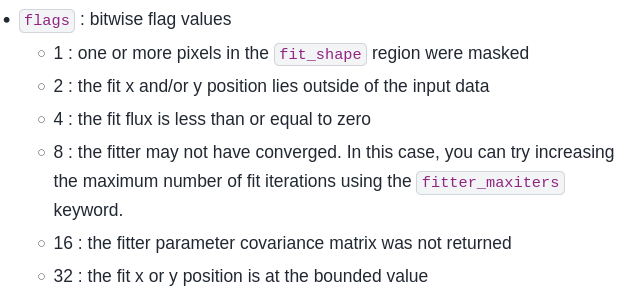

In [31]:
from IPython.display import display, Image
display(Image(filename="../flags.png", height=400, width=400))

In [32]:
# use this cell to remove flagged sources
filtered=[]
for i in range(len(output_fluxes)-1,0,-1):
    if output_fluxes[i]['flags'] > 2:
        print("Removing entry",i)
        output_fluxes.remove_row(i)
    else:
        filtered.append(sub_array[i])
output_fluxes

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags,MJD-OBS
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64,float64
1,1,0.0,102.07170518875253,100.36064311856909,7848.417381113799,102.02464423226333,99.72590235179062,6641.590907605356,0.16711500399198723,0.16972084128574183,517.490839854869,361,1,3.7883274806716303,-0.02229230899593069,0,60012.87638889
1,1,0.0,102.07170518875253,100.36064311856909,2246.441503449236,102.80554988709098,99.36218736644182,4932.7751271603365,0.3814339661529314,0.3874257302870842,844.8310965997119,361,1,8.417356663951495,0.015398092520453294,0,60014.02916667
1,1,0.0,102.07170518875253,100.36064311856909,4795.89276076944,102.06201490715503,99.65974111993097,4736.657088958893,0.14166627397628972,0.14454857306618035,311.2638372635015,361,1,3.3438893132147083,-0.011144112866271197,0,60014.81388889
1,1,0.0,102.07170518875253,100.36064311856909,4734.906120122497,102.11833405722871,99.3817622725928,3817.2540069815946,0.18072609810457038,0.1814972361879434,309.898045760286,361,1,3.9993345021023483,-0.01999605166577549,0,60015.82083333
1,1,0.0,102.07170518875253,100.36064311856909,3565.2566990001915,102.80840317190724,99.29250173798589,3181.4868579611143,0.20460230274841745,0.21002786089512995,303.06123473483694,361,1,4.95213210357381,-0.014970324900597087,0,60016.81527778
1,1,0.0,102.07170518875253,100.36064311856909,4894.721735011397,102.5520657007941,99.51010462390279,3708.58258106119,0.1809189817978423,0.18138818980375784,312.4473084496693,361,1,4.342029060425887,-0.02071241969788564,0,60017.81388889


In [33]:
filtered

['SUM_Aligned_20230313_B_bkgsub_conv_diff.fits',
 'SUM_Aligned_20230312_B_bkgsub_conv_diff.fits',
 'SUM_Aligned_20230311_B_bkgsub_conv_diff.fits',
 'SUM_Aligned_20230310_B_bkgsub_conv_diff.fits',
 'SUM_Aligned_20230309_B_bkgsub_conv_diff.fits']

In [34]:
# Look at the data we care about
output_fluxes['MJD-OBS'].info.format='.4f'
output_fluxes['x_fit'].info.format = '.4f'  # optional format
output_fluxes['y_fit'].info.format = '.4f'
output_fluxes['flux_fit'].info.format = '.4f'
output_fluxes['flux_err'].info.format = '.4f'
print(output_fluxes[('id', 'MJD-OBS','x_fit', 'y_fit', 'flux_fit','flux_err','flags')]) 


 id  MJD-OBS    x_fit    y_fit   flux_fit flux_err flags
--- ---------- -------- ------- --------- -------- -----
  1 60012.8764 102.0246 99.7259 6641.5909 517.4908     0
  1 60014.0292 102.8055 99.3622 4932.7751 844.8311     0
  1 60014.8139 102.0620 99.6597 4736.6571 311.2638     0
  1 60015.8208 102.1183 99.3818 3817.2540 309.8980     0
  1 60016.8153 102.8084 99.2925 3181.4869 303.0612     0
  1 60017.8139 102.5521 99.5101 3708.5826 312.4473     0


Text(0.5, 0, 'JD')

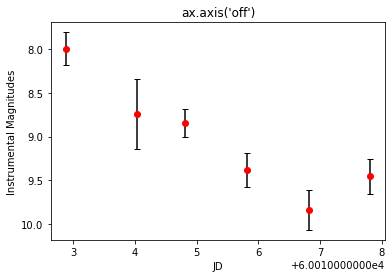

In [35]:
date=[row[17] for row in output_fluxes]
mag=30-2.5*(np.log([row[8] for row in output_fluxes])) # arbitrary shift
err=[]
for i in range(len(output_fluxes)):
    err.append(-2.5*(np.log(1+output_fluxes[i][11]/output_fluxes[i][8]))) # I think I've checked that this is correct...
#err=np.log([row[11] for row in output_fluxes]) # fix the errors!

fig, ax = plt.subplots()
ax.errorbar(date, mag, yerr=err, capsize=3,fmt="ro",ecolor = "black")
ax.invert_yaxis()
ax.set_title("ax.axis('off')")
ax.set_ylabel("Instrumental Magnitudes")
ax.set_xlabel("JD")

In [36]:
# Write this to data file
# Formatting just like aij!
# thanks chatGPT!
rows = zip(date, mag, err)

# Write to CSV
with open(out_dir+"/" + output_file, "w", newline="") as f:
    writer = csv.writer(f, delimiter=" ")
    
    # Write header
    writer.writerow(["JD Date-24000000", "Magnitude", "Error"])
    
    # Write data rows
    writer.writerows(rows)

print("CSV file created:",output_file," don't forget to move it to the right place!")

CSV file created: ctn-B-1.73-PSF.dat  don't forget to move it to the right place!


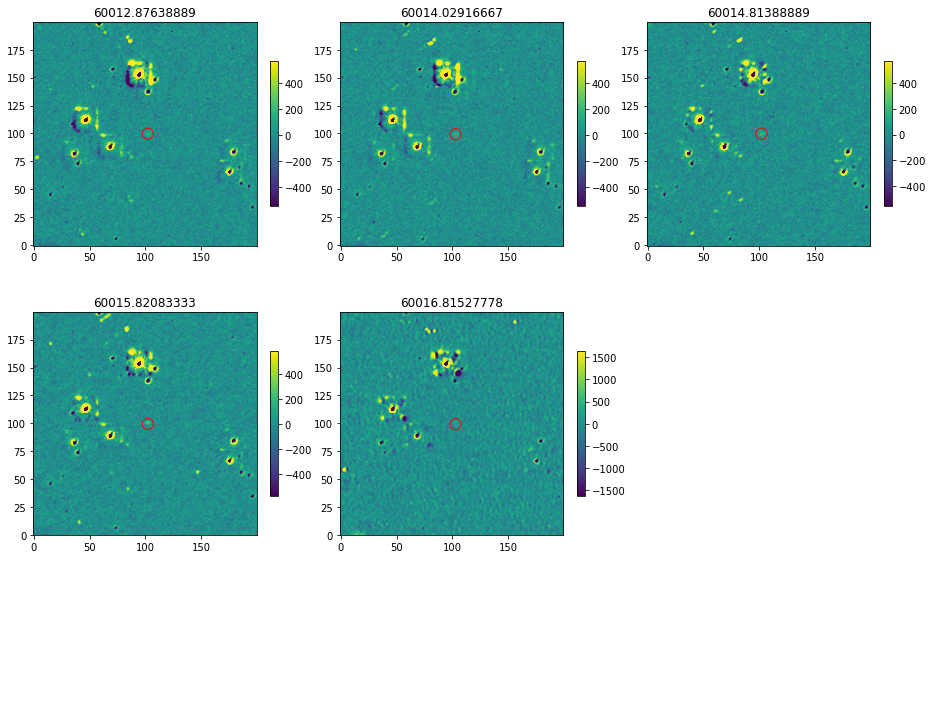

In [37]:
# plot them all
rows=int(np.ceil(len(filtered)/3))
fig, axs = plt.subplots(rows, 3,figsize=(16,16))
axes = axs.flatten()  # Flatten axes array for easier indexing
for i in range(rows*3):
    ax=axes[i]
    
    if i < (len(filtered)): # if a source, plot it
        sub_image = fits.open(os.path.join(out_dir,filtered[i]))
        # Just making sure the windows just catch the subtracted region.
        #xmin = round(output_fluxes[i]['x_fit']-0.6*window)
        #xmax = round(output_fluxes[i]['x_fit']+0.6*window)
        #ymin = round(output_fluxes[i]['y_fit']-0.6*window)
        #ymax = round(output_fluxes[i]['y_fit']+0.6*window)
        #print(xmin,xmax,ymin,ymax)
        aper = CircularAperture([output_fluxes[i]['x_fit'], output_fluxes[i]['y_fit']], r=init_rad)

        #fig, axs = plt.subplots(1, 3,figsize=(16,16))
        im=ax.set_title(output_fluxes[i]['MJD-OBS'])
        mean, median, std = sigma_clipped_stats(sub_image[0].data)
        im=ax.imshow(sub_image[0].data, origin='lower', cmap='viridis',vmin=median-10*std, vmax=median+10*std)
        aper.plot(ax,color='red')
        fig.colorbar(im,ax=ax,shrink=0.25)

    else:
        ax.axis('off')
#plt.imshow(sub_image[0].data[xmin:xmax,ymin:ymax], origin='lower', cmap='viridis')
#aper.plot(color='red')
#plt.colorbar()

#plt.tight_layout()
plt.subplots_adjust(hspace=-0.5, wspace=0.1)
plt.show()
#fig, axs = plt.subplots(1, 4,figsize=(16,16))
#im0=axs[0].set_title('Science Image Subtraction Region')
#im0=axs[0].imshow(sci_image_shift[int(y)-window:int(y)+window,int(x)-window:int(x)+window])
#fig.colorbar(im0,ax=axs[0],shrink=0.25)

Next lines plot the full images. (note that this is WITH the cleaning, but the raw subtracted images are still in the output directory).

In [38]:
'''
#fig, axs = plt.subplots(len(sci_conv_array), 2, figsize=(50,50)) # ugh figsize does nothing.
for i in range(len(sci_conv_array)):
    fig, axs = plt.subplots(1, 2, figsize=(50,50))
    sci_image = fits.open(sci_conv_array[i])
    sub_image = fits.open("out/"+sub_array[i])
    
    w = WCS(sub_image[0].header)
    #print(w)
    coord = SkyCoord(ra=RA * u.deg, dec=Dec * u.deg, frame='icrs')
    #print(coord)
    x,y=w.world_to_pixel(coord)
    #print(x,y)
    
    aper = CircularAperture((x,y), 8)
    annulus = CircularAnnulus((x,y), 16,25)
    aperstats = ApertureStats(sub_image[0].data, annulus)
    bkg_mean = aperstats.mean
    
    total_bkg = bkg_mean * aper.area
    print("mean background:", bkg_mean,"total background:",total_bkg)
    phot_table = aperture_photometry(sub_image[0].data, aper)
    #phot_table['aperture_sum'].info.format = '%.8g'  # for consistent table output
    
    phot_bkgsub = phot_table['aperture_sum'] - total_bkg
    phot_table['aperture_sum_bkgsub'] = phot_bkgsub
    print(phot_table)
    
    mean, median, std = sigma_clipped_stats(sub_image[0].data)
    #axs[0].plot(aper)
    #axs[0].scatter(x, y, marker='o', color='r', facecolors='none',s=1000,linewidths=2)
    axs[0].imshow(sub_image[0].data, vmin=median-2*std, vmax=median+2*std, cmap='gray')
        
    mean, median, std = sigma_clipped_stats(sci_image[0].data)
    axs[1].imshow(sci_image[0].data, vmin=median-2*std, vmax=median+2*std, cmap='gray')
    plt.show()
'''

'\n#fig, axs = plt.subplots(len(sci_conv_array), 2, figsize=(50,50)) # ugh figsize does nothing.\nfor i in range(len(sci_conv_array)):\n    fig, axs = plt.subplots(1, 2, figsize=(50,50))\n    sci_image = fits.open(sci_conv_array[i])\n    sub_image = fits.open("out/"+sub_array[i])\n    \n    w = WCS(sub_image[0].header)\n    #print(w)\n    coord = SkyCoord(ra=RA * u.deg, dec=Dec * u.deg, frame=\'icrs\')\n    #print(coord)\n    x,y=w.world_to_pixel(coord)\n    #print(x,y)\n    \n    aper = CircularAperture((x,y), 8)\n    annulus = CircularAnnulus((x,y), 16,25)\n    aperstats = ApertureStats(sub_image[0].data, annulus)\n    bkg_mean = aperstats.mean\n    \n    total_bkg = bkg_mean * aper.area\n    print("mean background:", bkg_mean,"total background:",total_bkg)\n    phot_table = aperture_photometry(sub_image[0].data, aper)\n    #phot_table[\'aperture_sum\'].info.format = \'%.8g\'  # for consistent table output\n    \n    phot_bkgsub = phot_table[\'aperture_sum\'] - total_bkg\n    phot_ta